# <font color='purple'>Preprocessing QC statistics </font> 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
NOVA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps'
NOVA_DATA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps'
LOGS_PATH = os.path.join(NOVA_DATA_HOME, "outputs/preprocessing/spd/logs/dNLS")
PLOT_PATH = os.path.join(NOVA_HOME, 'src', 'preprocessing', 'notebooks','figures','dNLS')
os.chdir(NOVA_HOME)
import pandas as pd
import numpy as np
# plt.rcParams["image.cmap"] = "Set1"
import contextlib
import io
from IPython.display import display, Javascript

from tools.preprocessing_tools.qc_utils import log_files_qc, run_validate_folder_structure, display_diff, sample_and_calc_variance, \
                                                show_site_survival_dapi_brenner, show_site_survival_dapi_cellpose, \
                                                show_site_survival_dapi_tiling, show_site_survival_target_brenner, \
                                                calc_total_sums, plot_filtering_heatmap, show_total_sum_tables, \
                                                plot_cell_count, plot_catplot, plot_hm_combine_batches, plot_hm, \
                                                run_calc_hist_new
                                                
from tools.preprocessing_tools.qc_config import dnls_panels, dnls_markers, dnls_marker_info, dnls_cell_lines, \
                                                dnls_cell_lines_to_cond, dnls_cell_lines_for_disp, reps, \
                                                dnls_line_colors, dnls_lines_order, dnls_custom_palette, \
                                                dnls_expected_dapi_raw, markers, custom_palette

In [3]:
df = log_files_qc(LOGS_PATH, only_wt_cond=False)
df_dapi = df[df.marker=='DAPI']
df_target = df[df.marker!='DAPI']
# we need to match between the raw marker name (TDP43) and the processed marker name (TDP43N / TDP43B)
df_target.loc[df_target['marker'] == 'TDP43', 'marker'] += df_target['panel'].str.replace('panel', '')


reading logs of batch2
reading logs of batch4
reading logs of batch3
reading logs of batch5

Total of 4 files were read.
Before dup handeling  (100193, 22)
After duplication removal #1: (100193, 23)
After duplication removal #2: (100193, 23)


In [4]:
# choose batches
batches = [f'batch{i}' for i in range(3,6)]
batches

['batch3', 'batch4', 'batch5']

## Actual Files Validation

### Raw Files Validation

1. How many site **tiff** files do we have in each folder?
2. Are all existing files valid? (tif, at least 2049kB, not corrupetd)

batch3
Folder structure is invalid. Missing paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch3/WT/panelN
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch3/TDP43/panelN
No bad files are found.
Total Sites:  25800


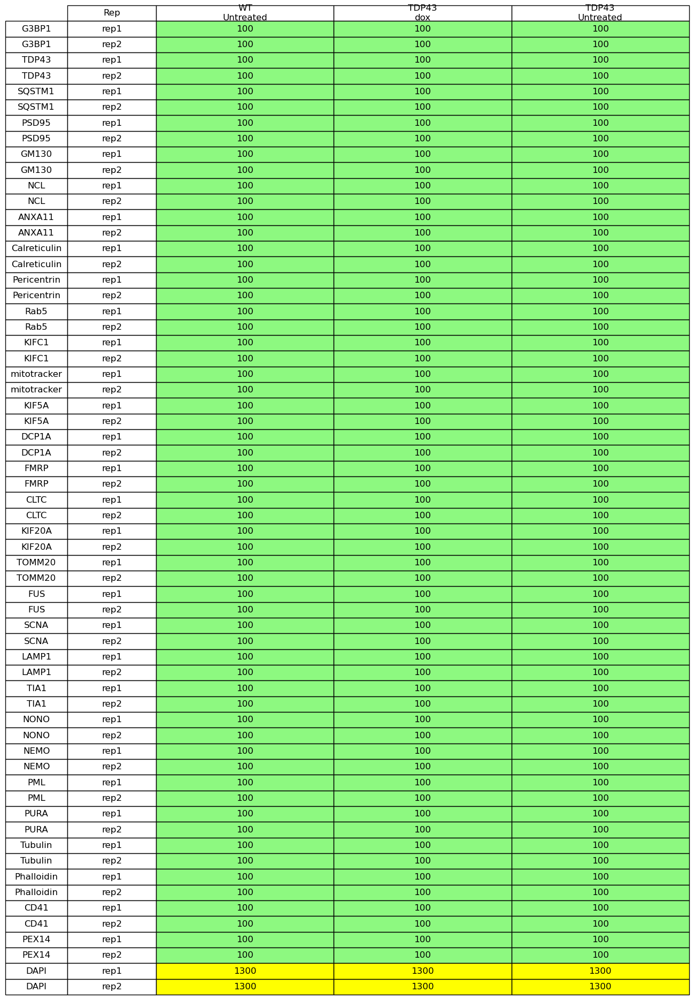

batch4
Folder structure is invalid. Missing paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch4/WT/panelN
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch4/TDP43/panelN
No bad files are found.
Total Sites:  25500


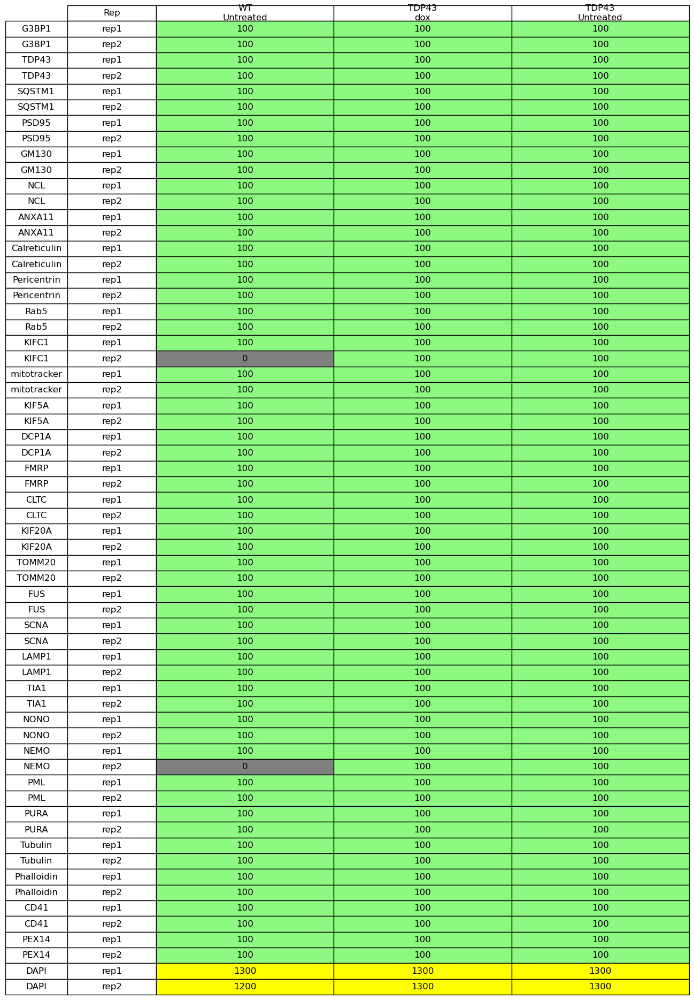

batch5
Folder structure is valid.
No bad files are found.
Total Sites:  26897


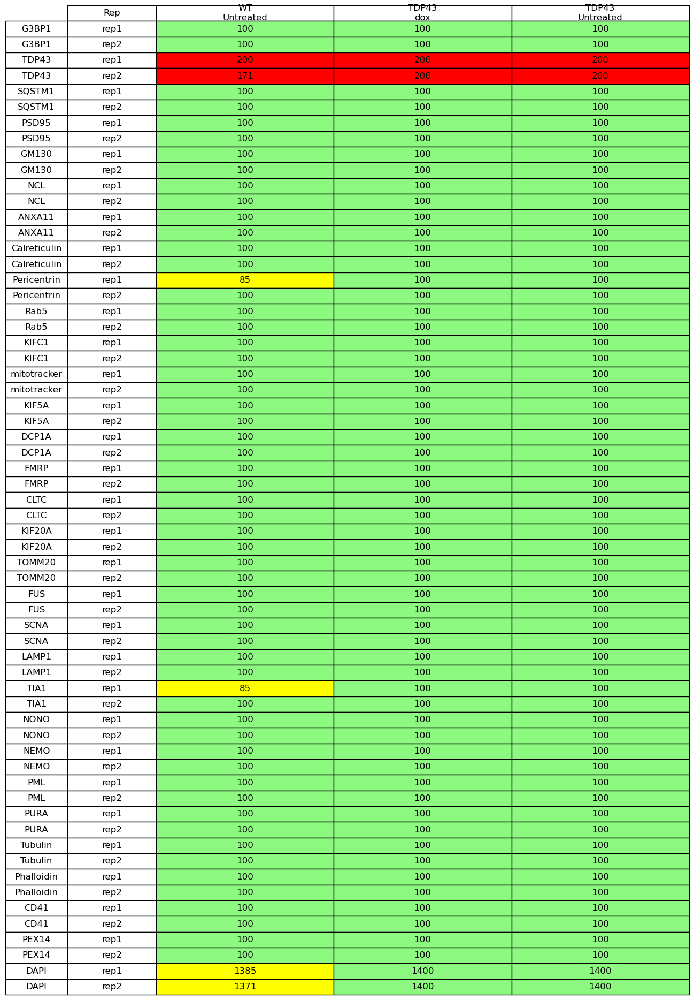

In [4]:

root_directory_raw = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'raw', 'SpinningDisk','deltaNLS_sort')

raws = run_validate_folder_structure(root_directory_raw, False, dnls_panels, dnls_markers.copy(),PLOT_PATH, dnls_marker_info,
                                    dnls_cell_lines_to_cond, reps, dnls_cell_lines_for_disp, dnls_expected_dapi_raw,
                                     batches=batches, fig_width=5)

### Processed Files Validation

1. How many site **npy** files do we have in each folder? -> How many sites survived the pre-processing?
2. Are all existing files valid? (at least 100kB, npy not corrupted)

batch3
Folder structure is invalid. Missing paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch3/WT/Untreated/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch3/TDP43/dox/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch3/TDP43/Untreated/TDP43N
No bad files are found.
Total Sites:  24336


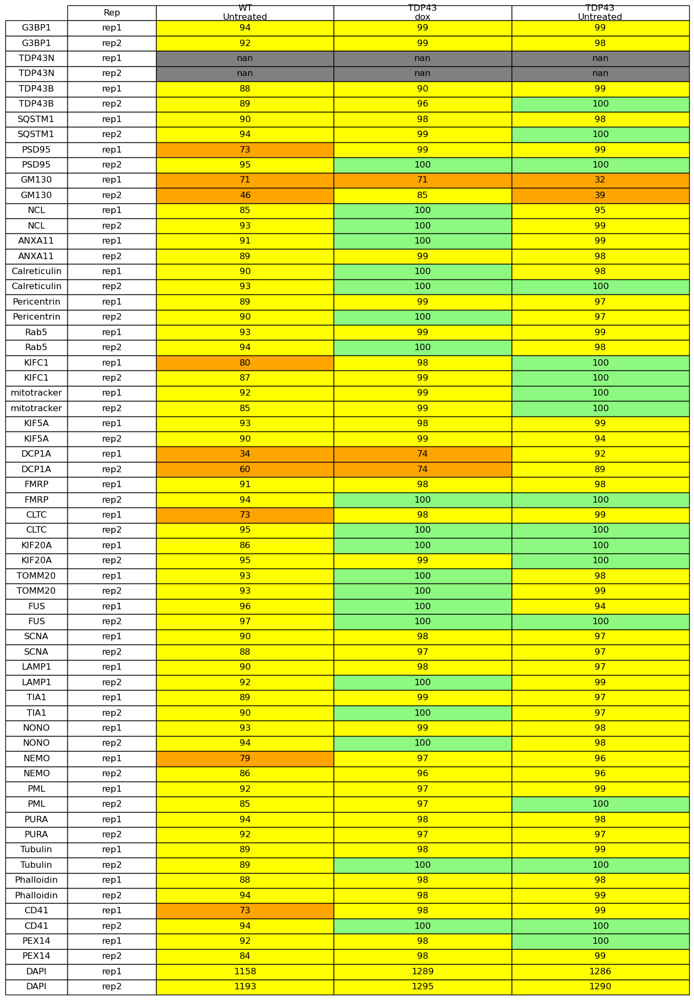

batch4
Folder structure is invalid. Missing paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch4/WT/Untreated/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch4/TDP43/dox/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch4/TDP43/Untreated/TDP43N
No bad files are found.
Total Sites:  23638


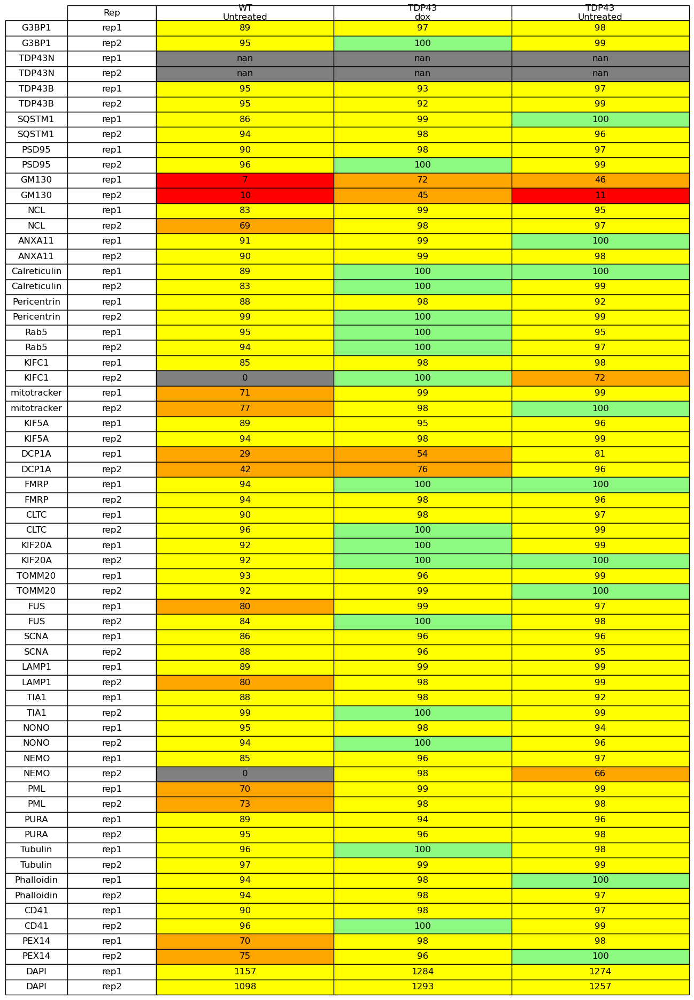

batch5
Folder structure is valid.
No bad files are found.
Total Sites:  25527


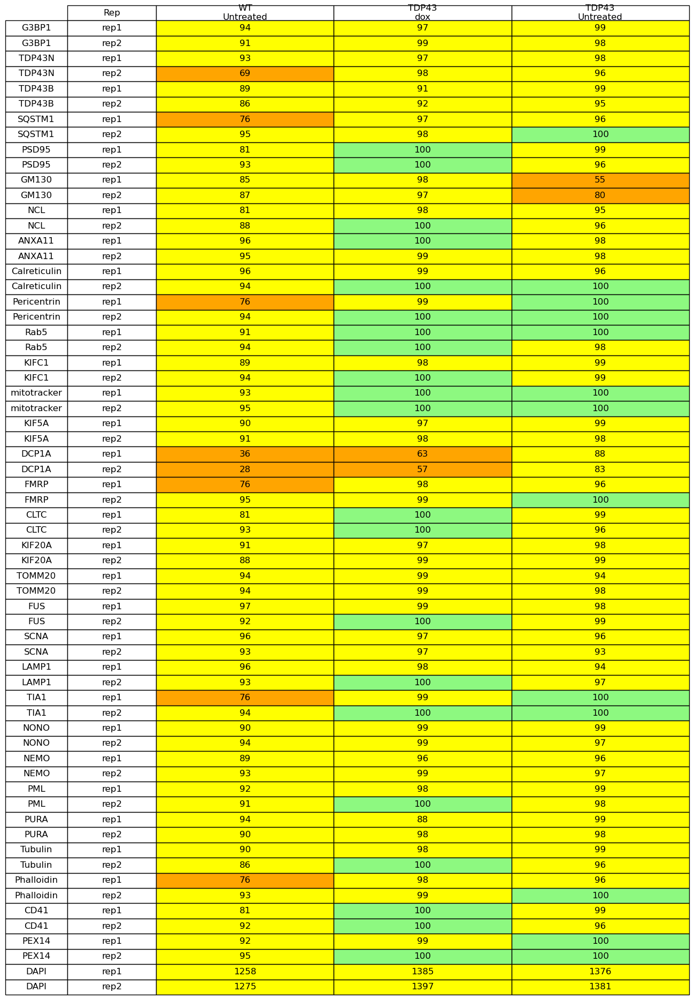

In [5]:
root_directory_proc = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'processed', 'spd2',
                              'SpinningDisk','deltaNLS')
procs = run_validate_folder_structure(root_directory_proc, True, dnls_panels, dnls_markers,PLOT_PATH,dnls_marker_info,
                                    dnls_cell_lines_to_cond, reps, dnls_cell_lines_for_disp, dnls_expected_dapi_raw,
                                     batches=batches, fig_width=5)

### Difference between Raw and Processed

batch3


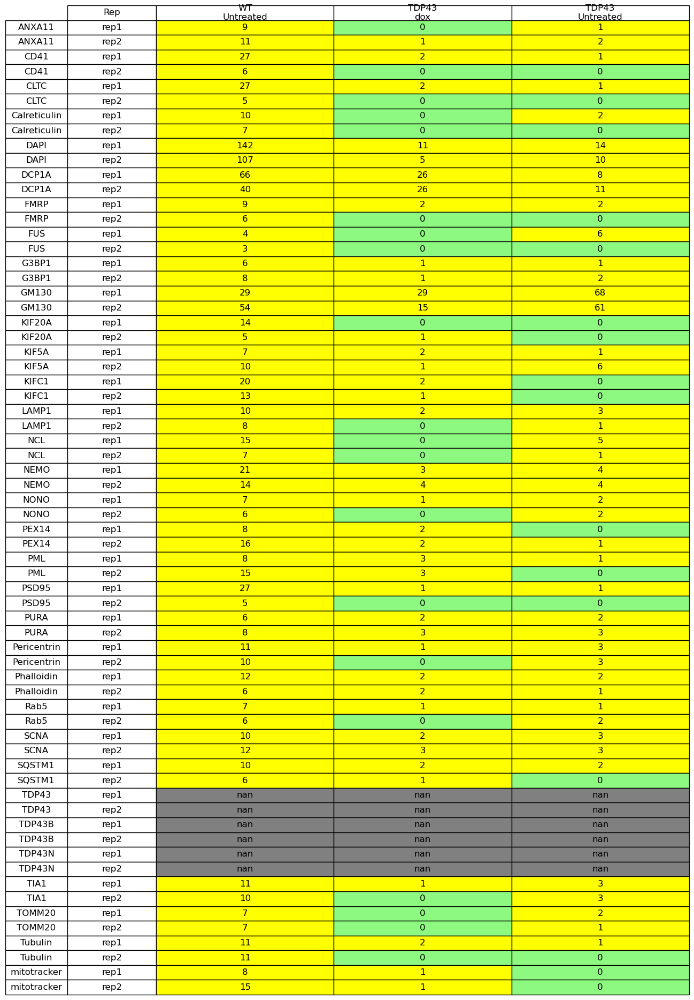

batch4


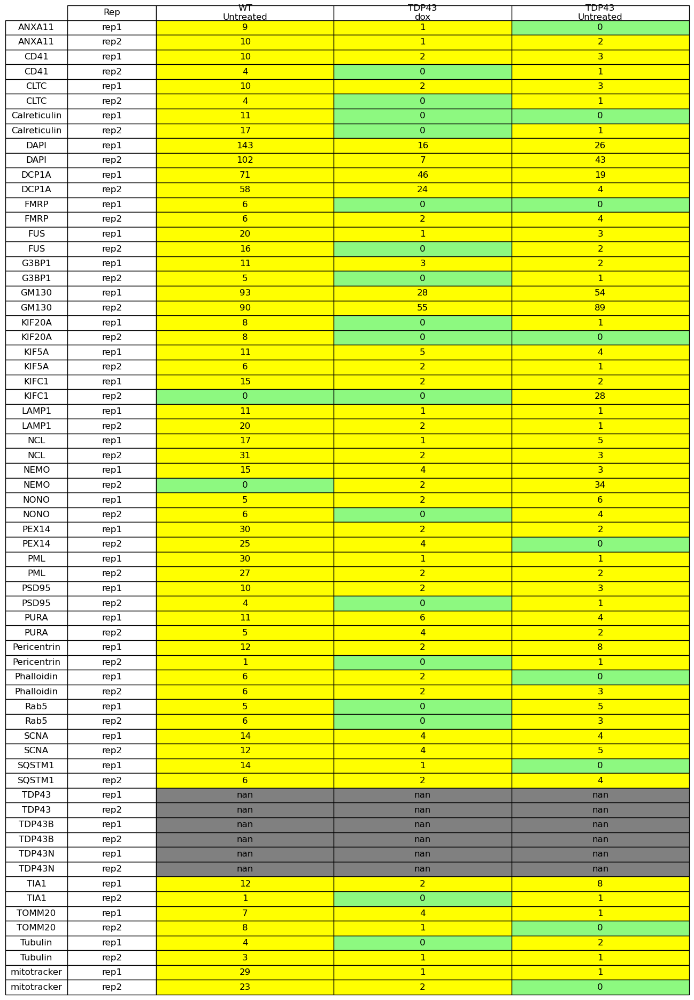

batch5


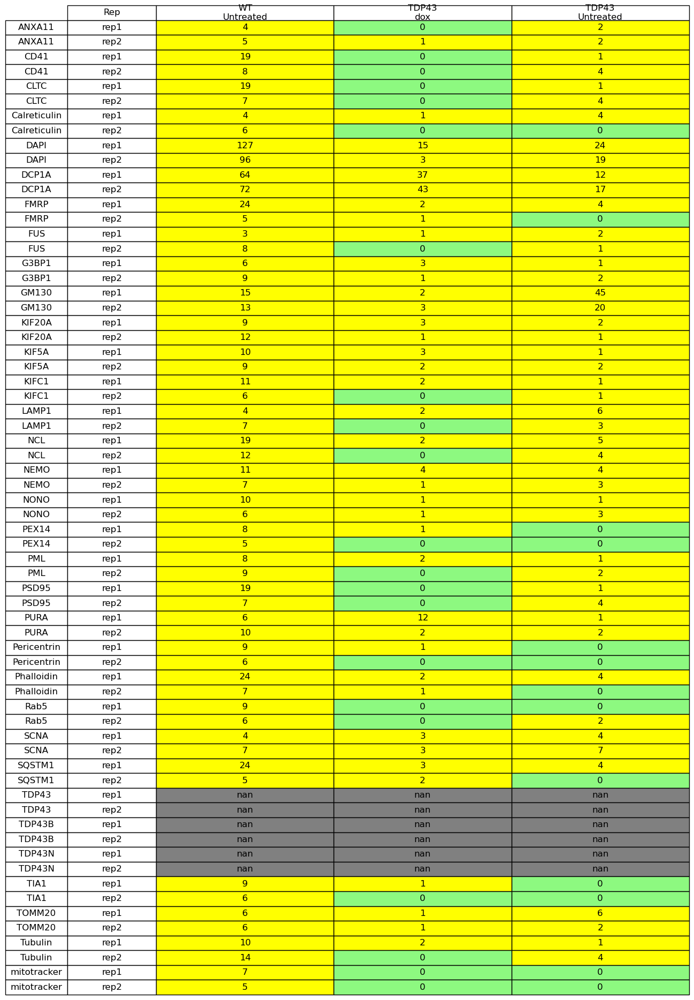

In [8]:
display_diff(batches, raws, procs, PLOT_PATH, fig_width=5)

### Variance in each batch (of processed files)

In [9]:
for batch in batches:
    with contextlib.redirect_stdout(io.StringIO()):
        var = sample_and_calc_variance(root_directory_proc, batch, 
                                       sample_size_per_markers=200, cond_count=2, rep_count=len(reps), 
                                       num_markers=len(dnls_markers))
    print(f'{batch} var: ',var)

batch3 var:  0.010357440534791741
batch4 var:  0.010663615289945838
batch5 var:  0.010209010132942722


## Preprocessing Filtering qc
By order of filtering

### 1. % site survival after Brenner on DAPI channel
Percentage out of the total sites

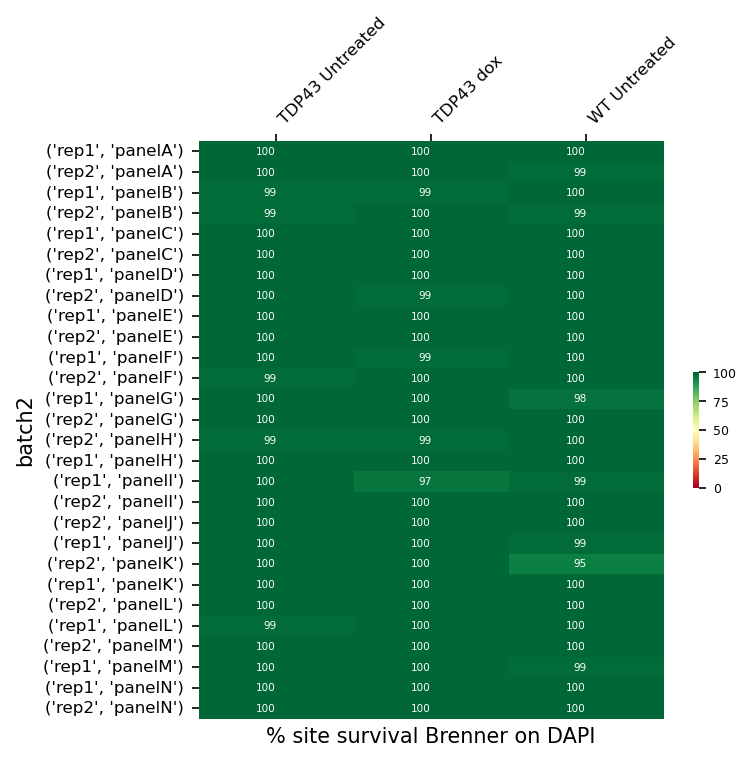

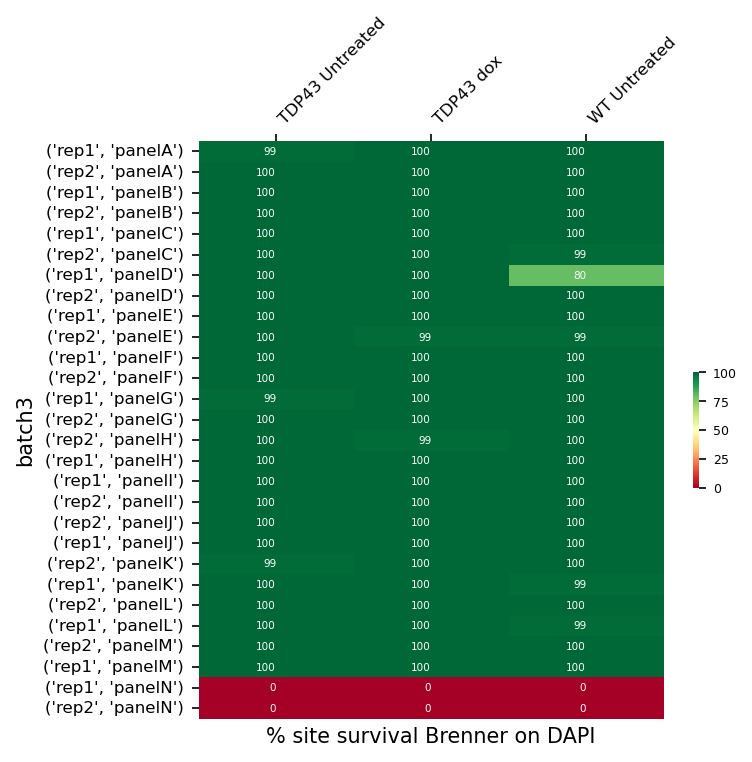

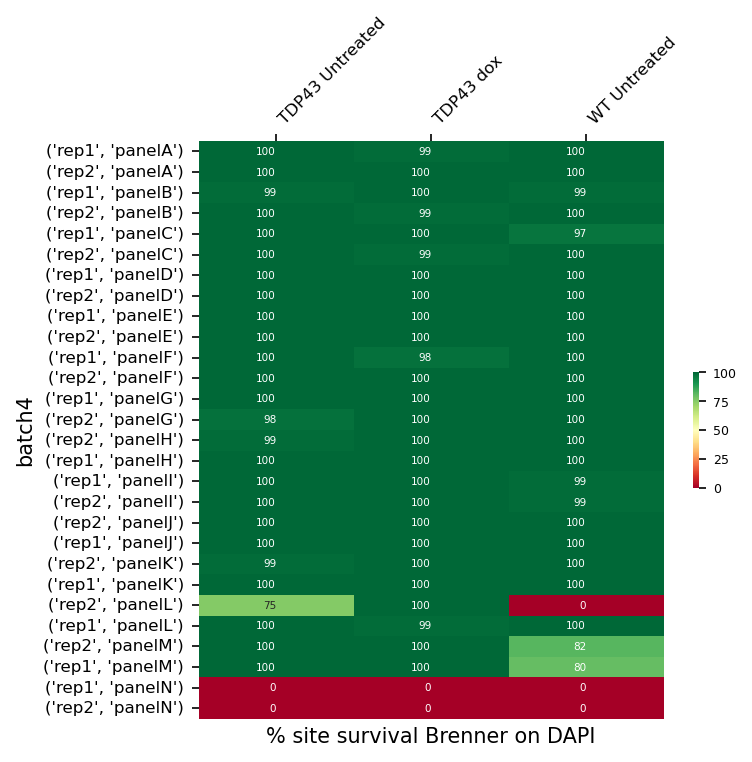

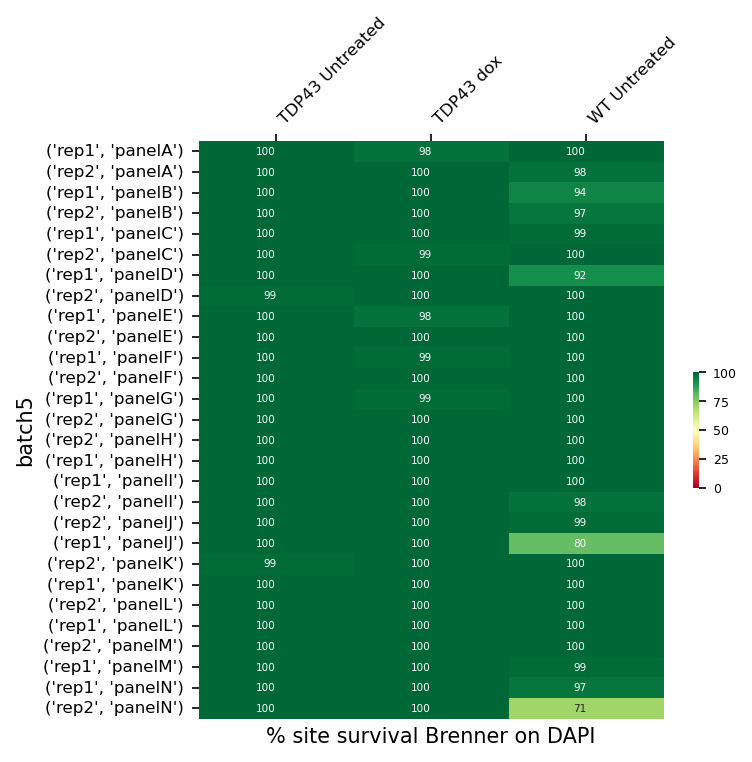

In [14]:
dapi_filter_by_brenner = show_site_survival_dapi_brenner(df_dapi,batches, dnls_line_colors, dnls_panels, reps)

### 2. % Site survival after Cellpose
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if Cellpose found 0 cells in it.**

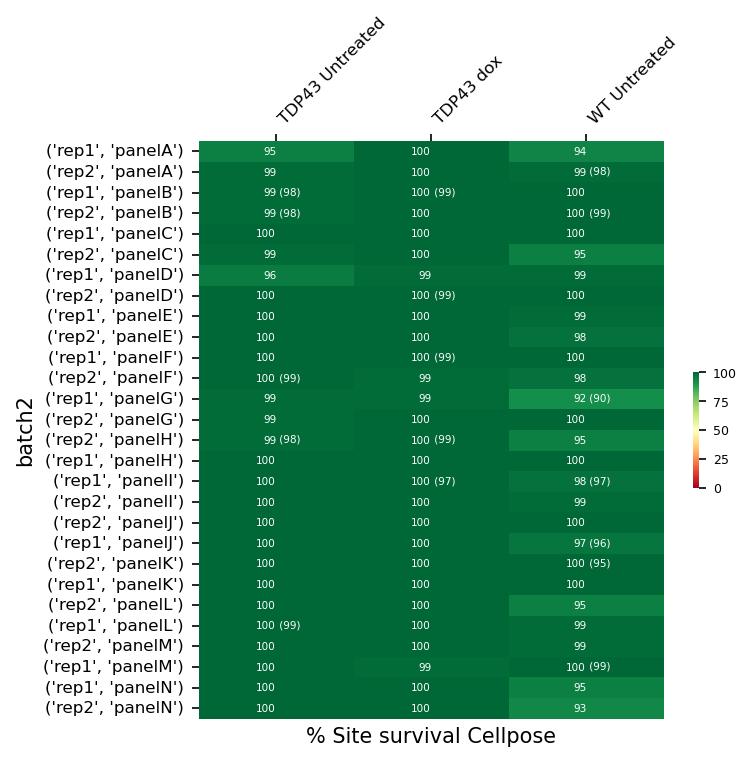

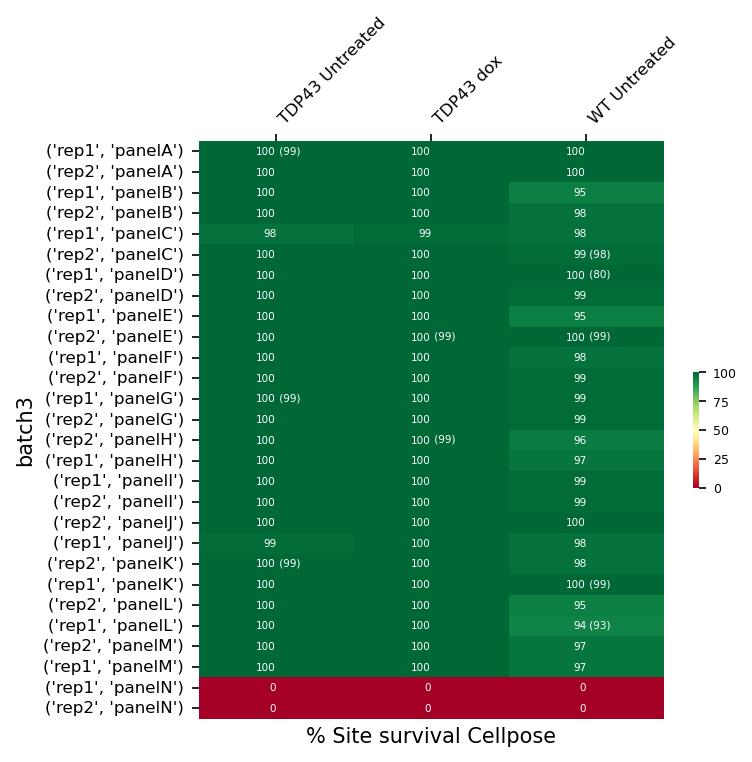

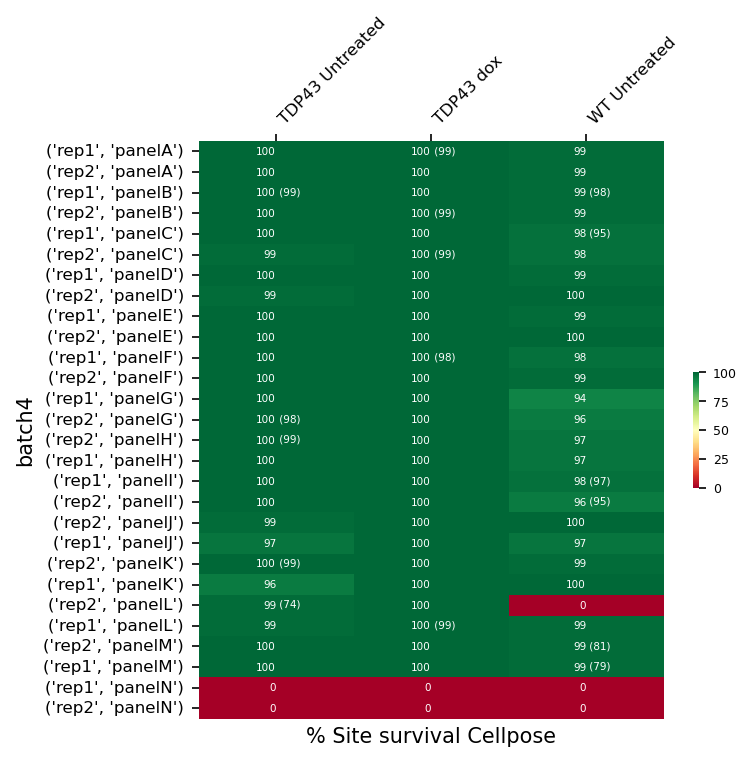

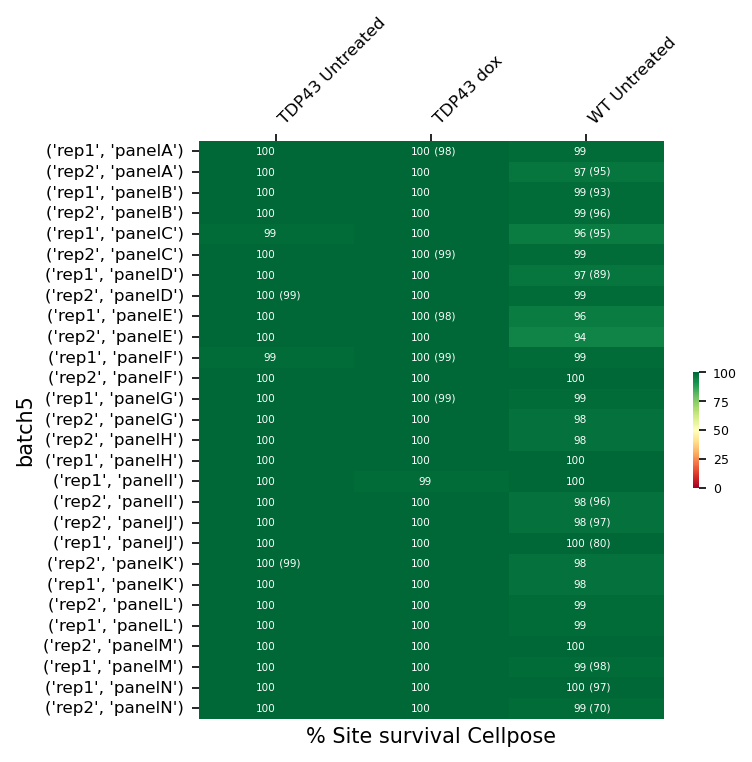

In [15]:
dapi_filter_by_cellpose = show_site_survival_dapi_cellpose(df_dapi, batches, dapi_filter_by_brenner, dnls_line_colors, dnls_panels, reps)

### 3. % Site survival by tiling
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if after tiling, no tile is containing at least one whole cell that Cellpose detected.**

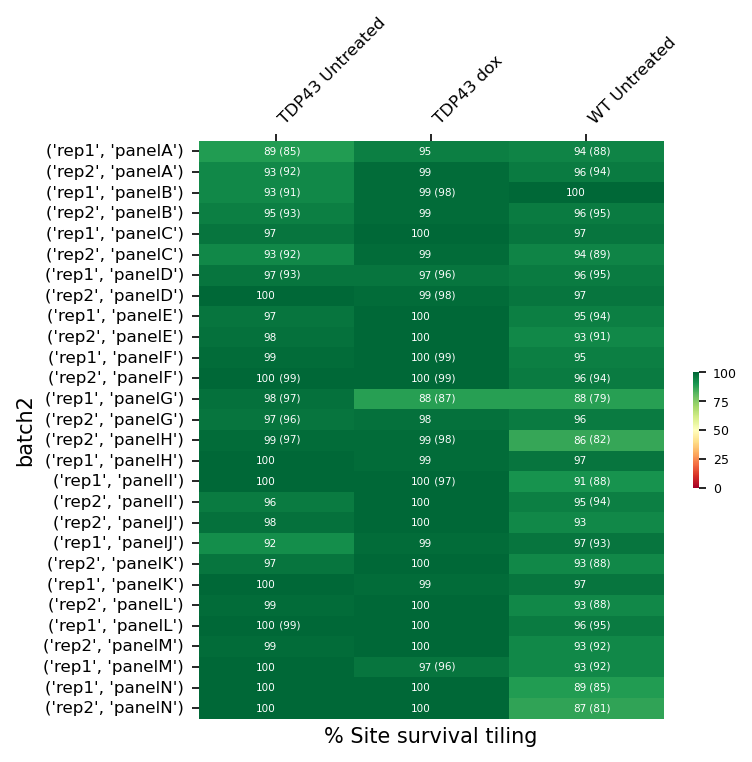

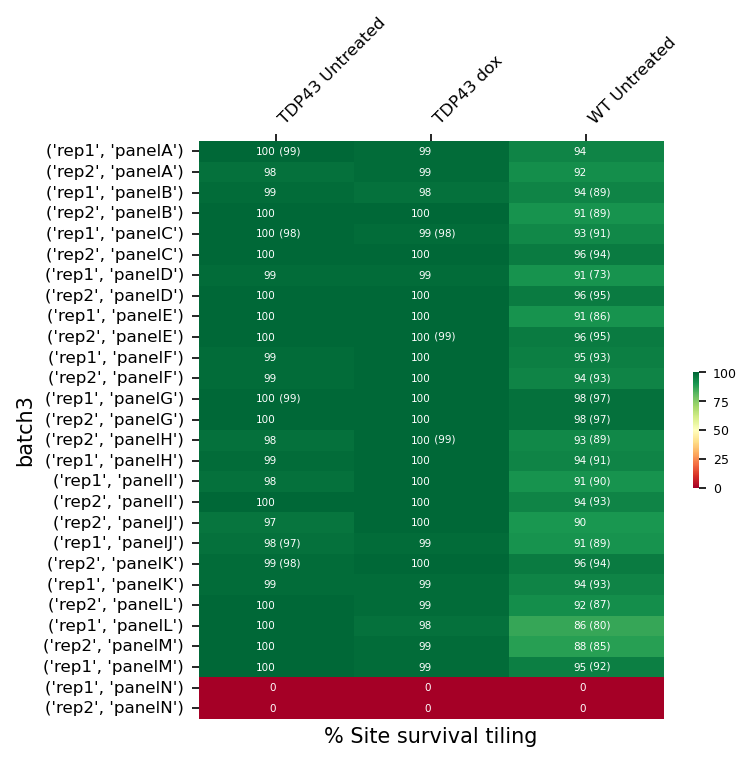

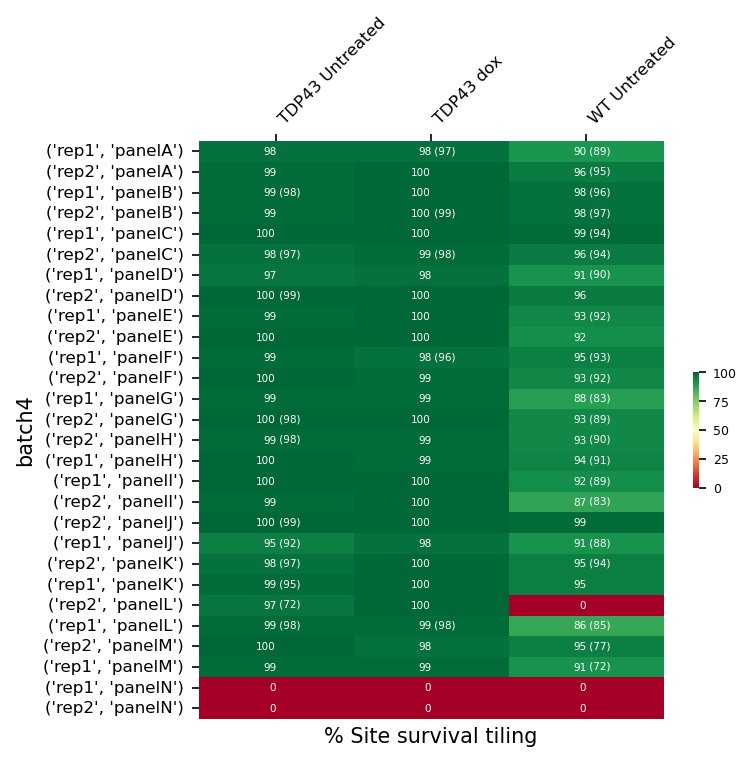

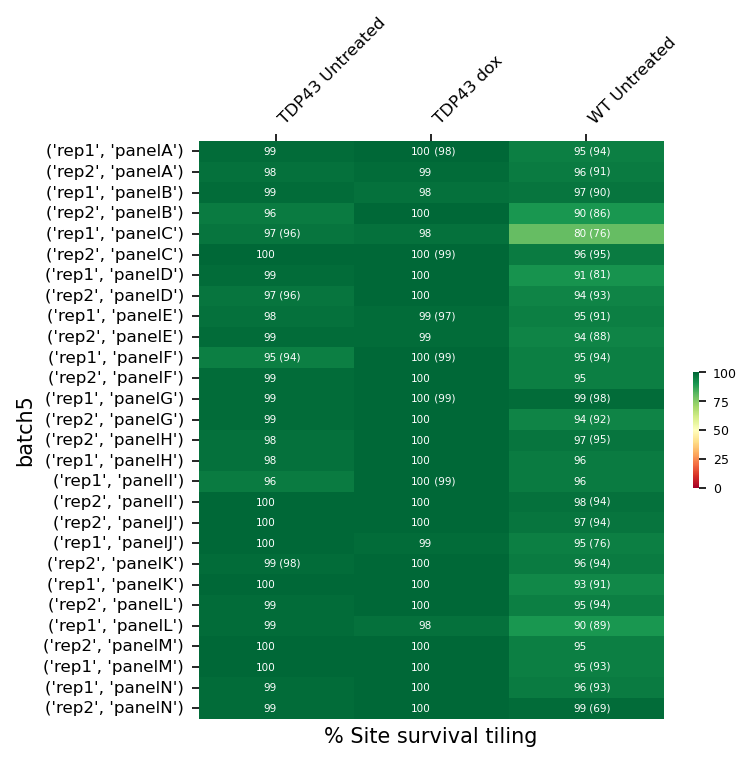

In [16]:
dapi_filter_by_tiling=show_site_survival_dapi_tiling(df_dapi, batches, dapi_filter_by_cellpose, dnls_line_colors, dnls_panels, reps)

### 4. % Site survival after Brenner on target channel
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values (if different than the percentages).

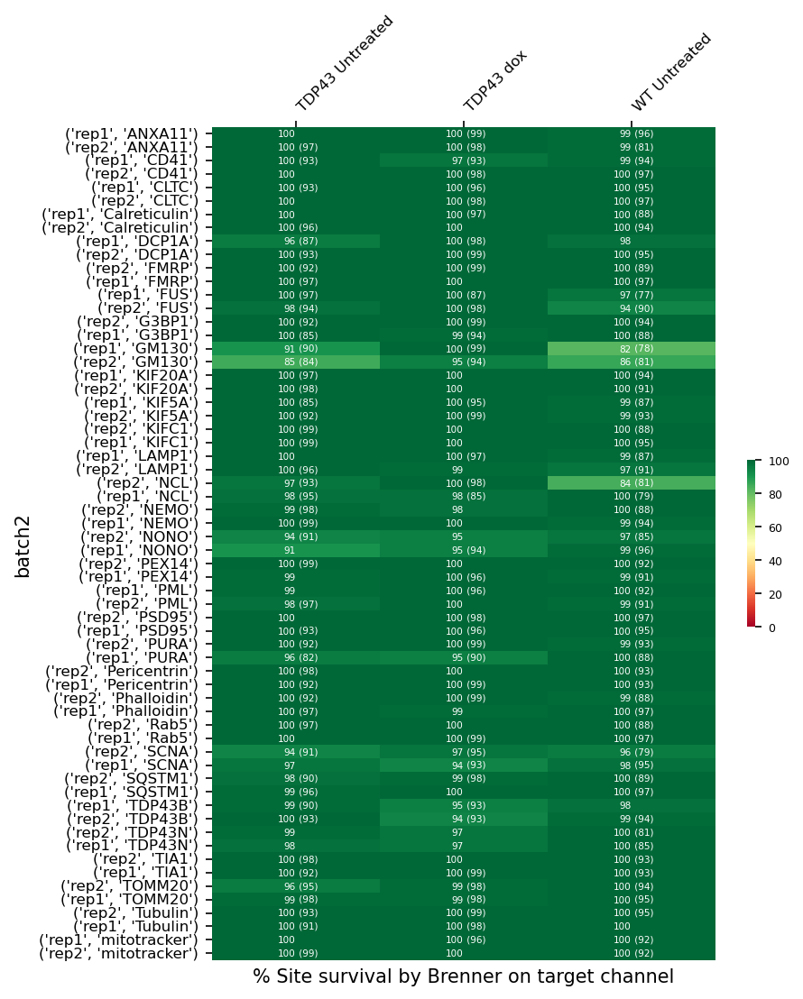

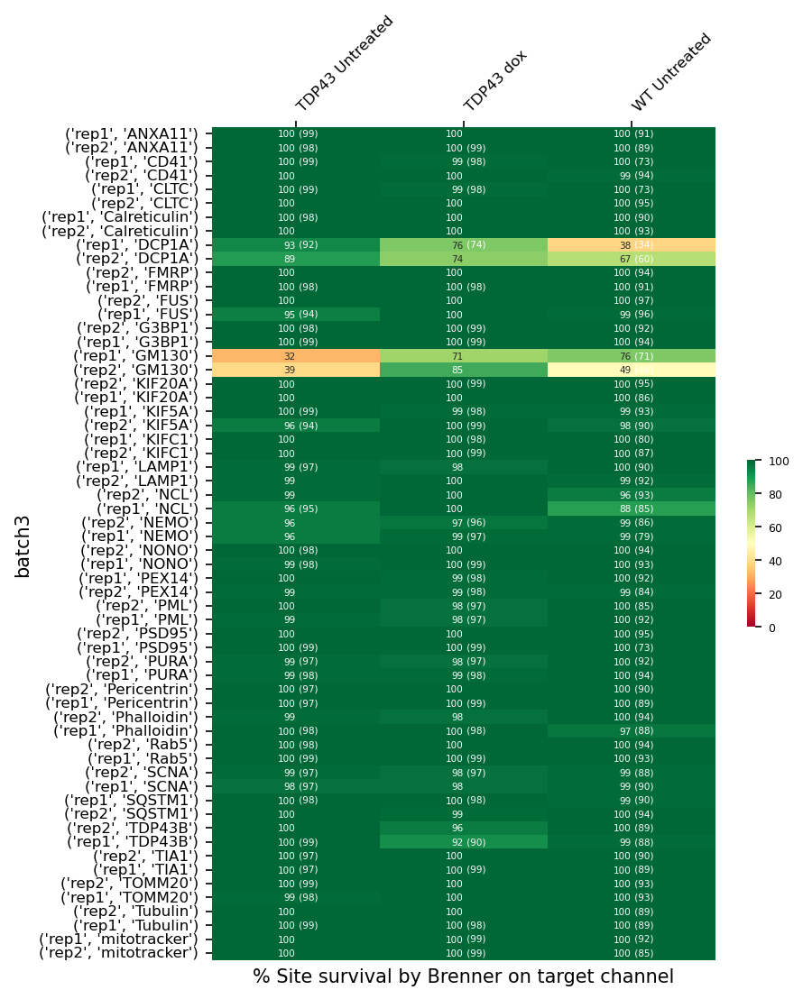

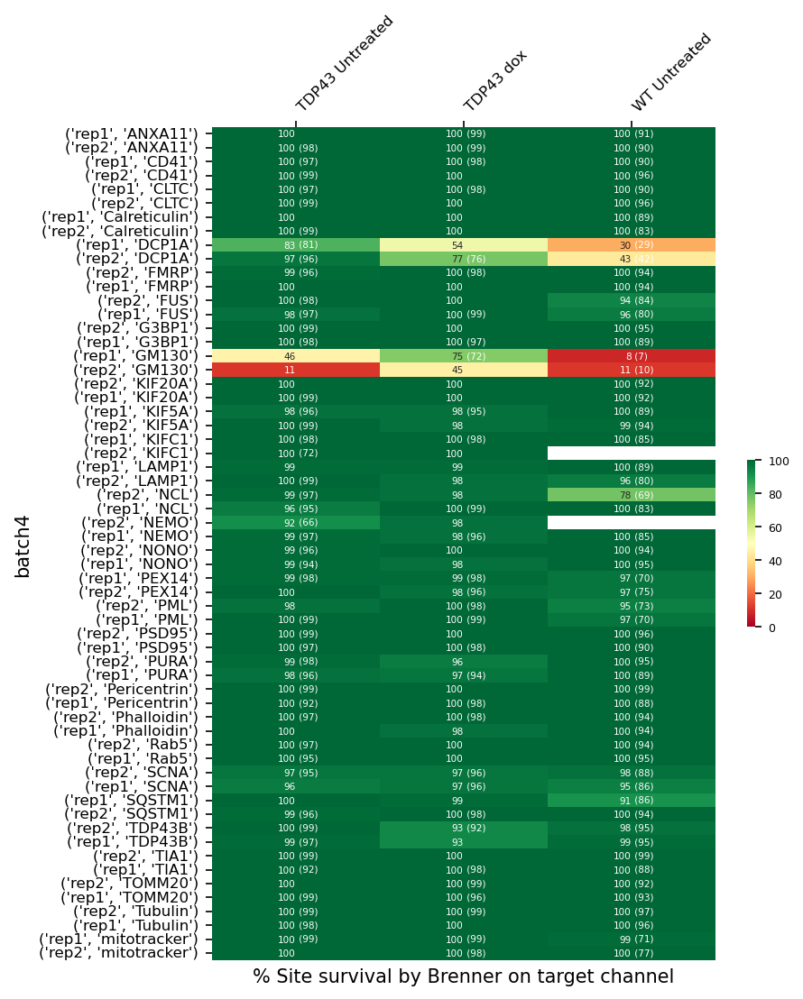

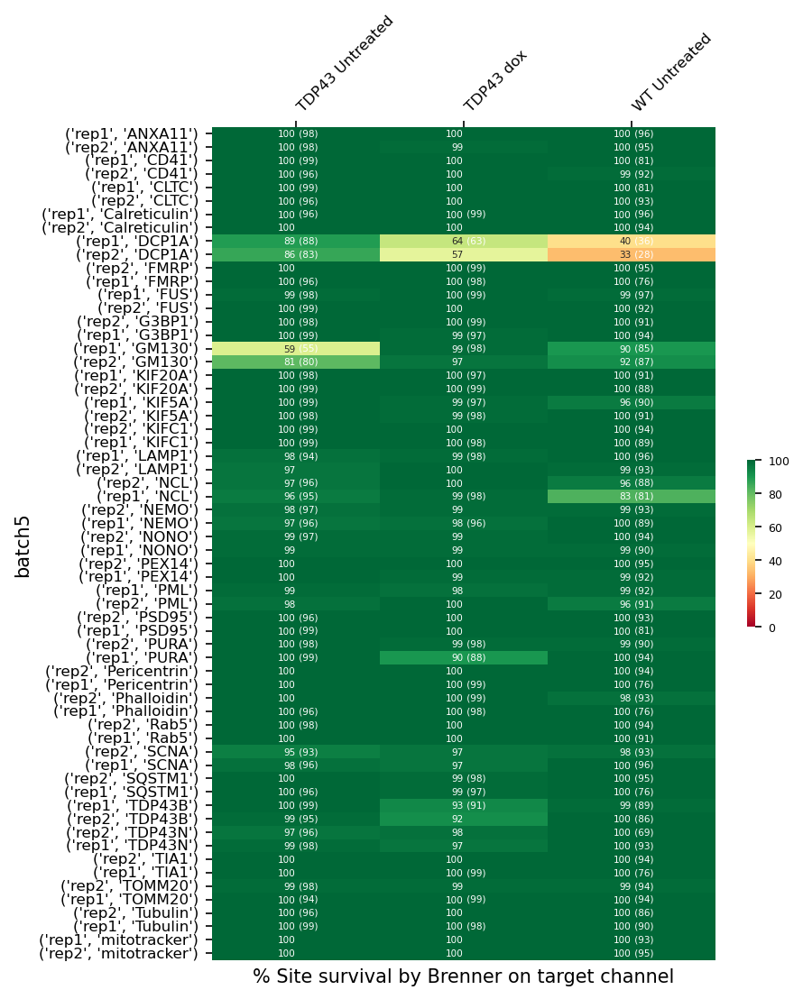

In [17]:
show_site_survival_target_brenner(df_dapi, df_target, dapi_filter_by_tiling, dnls_markers)

## Statistics About the Processed Files

In [6]:
names = ['Total number of tiles', 'Total number of whole cells']
stats = ['n_valid_tiles','site_whole_cells_counts_sum','site_cell_count','site_cell_count_sum']
total_sum = calc_total_sums(df_target, df_dapi, stats, dnls_markers)

### Total tiles

In [7]:
markers_for_dnls = markers.copy()
markers_for_dnls.remove('DAPI')
markers_for_dnls.remove('TIA1')
markers_for_dnls += ['TDP43B']
total_sum[(total_sum.batch.str.contains('3|4|5', regex=True)) & (total_sum.marker.isin(markers_for_dnls))].n_valid_tiles.sum()

238282

### Total Dapi tiles


In [12]:
total_sum[(total_sum.batch.str.contains('3|4|5', regex=True)) 
          & (total_sum.marker == 'DAPI')].n_valid_tiles.sum()

136674

### Total neurons

In [11]:
total_sum[(total_sum.batch.str.contains('3|4|5', regex=True)) &
          (total_sum.marker.isin(markers_for_dnls))].site_cell_count_sum.sum()

1115848.0

### Total Dapi neurons

In [13]:
total_sum[(total_sum.batch.str.contains('3|4|5', regex=True)) 
          & (total_sum.marker == 'DAPI')].site_cell_count_sum.sum()

643661.0

<Axes: >

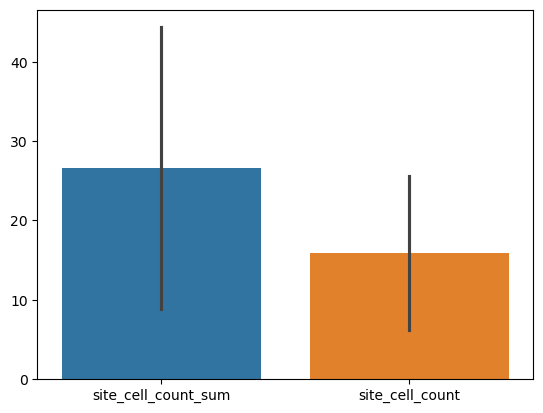

In [19]:
import seaborn as sns
sns.barplot(df_dapi[['site_cell_count_sum','site_cell_count']], errorbar='sd')

In [20]:
show_total_sum_tables(total_sum)

,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch2,,,,
count,186.000000,186.000000,186.000000,186.000000
mean,494.833333,4.948333,545.451613,1432.537634
std,155.225413,1.552254,177.298833,566.973560
min,211.000000,2.110000,224.000000,433.000000
25%,370.000000,3.700000,398.000000,901.000000
50%,458.000000,4.580000,505.000000,1442.500000
75%,614.000000,6.140000,689.000000,1884.500000
max,858.000000,8.580000,964.000000,2570.000000
sum,92039.000000,NaN,101454.000000,266452.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch3,,,,
count,180.000000,180.000000,180.000000,180.000000
mean,580.961111,5.809611,649.600000,1625.372222
std,211.773790,2.117738,246.052286,720.121863
min,123.000000,1.230000,131.000000,285.000000
25%,330.000000,3.300000,356.000000,738.500000
50%,676.000000,6.760000,760.500000,1942.500000
75%,760.000000,7.600000,857.000000,2240.500000
max,891.000000,8.910000,1006.000000,2647.000000
sum,104573.000000,NaN,116928.000000,292567.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch4,,,,
count,178.000000,178.000000,178.000000,178.000000
mean,536.831461,5.368315,596.056180,1526.207865
std,198.066344,1.980663,226.747345,676.855271
min,40.000000,0.400000,42.000000,81.000000
25%,355.500000,3.555000,398.500000,816.250000
50%,571.000000,5.710000,629.000000,1730.500000
75%,712.750000,7.127500,787.250000,2106.000000
max,887.000000,8.870000,993.000000,2613.000000
sum,95556.000000,NaN,106098.000000,271665.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch5,,,,
count,186.000000,186.000000,186.000000,186.000000
mean,555.715054,5.557151,620.586022,1555.639785
std,191.168214,1.911682,221.699518,661.529762
min,105.000000,1.050000,114.000000,249.000000
25%,366.000000,3.660000,396.000000,816.750000
50%,598.000000,5.980000,687.000000,1740.500000
75%,733.750000,7.337500,828.500000,2142.000000
max,892.000000,8.920000,1013.000000,2532.000000
sum,103363.000000,NaN,115429.000000,289349.000000


,n valid tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
All batches,,,,
count,730.000000,730.000000,730.000000,7.300000e+02
mean,541.823288,5.418233,602.615068,1.534292e+03
std,192.153210,1.921532,221.970582,6.603195e+02
min,40.000000,0.400000,42.000000,8.100000e+01
25%,358.500000,3.585000,387.250000,8.080000e+02
50%,569.000000,5.690000,637.000000,1.700500e+03
75%,708.750000,7.087500,801.500000,2.106000e+03
max,892.000000,8.920000,1013.000000,2.647000e+03
sum,395531.000000,NaN,439909.000000,1.120033e+06


### Show Total Tile Counts
For each batch, cell line, replicate and markerTotal number of tiles

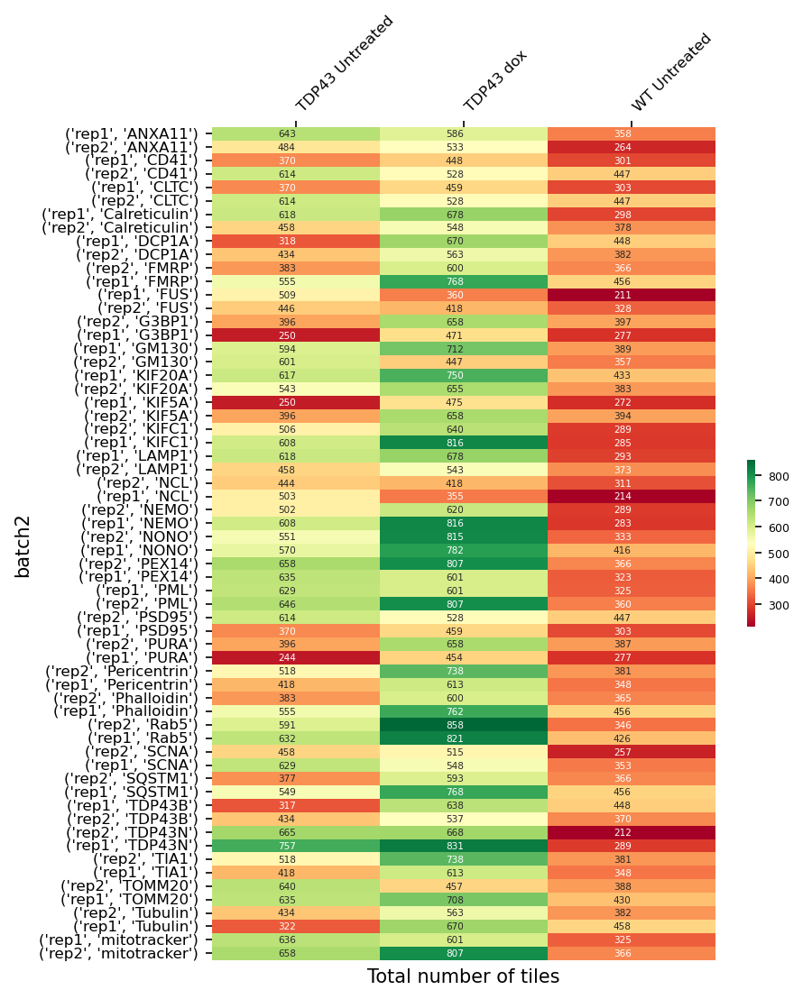

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)


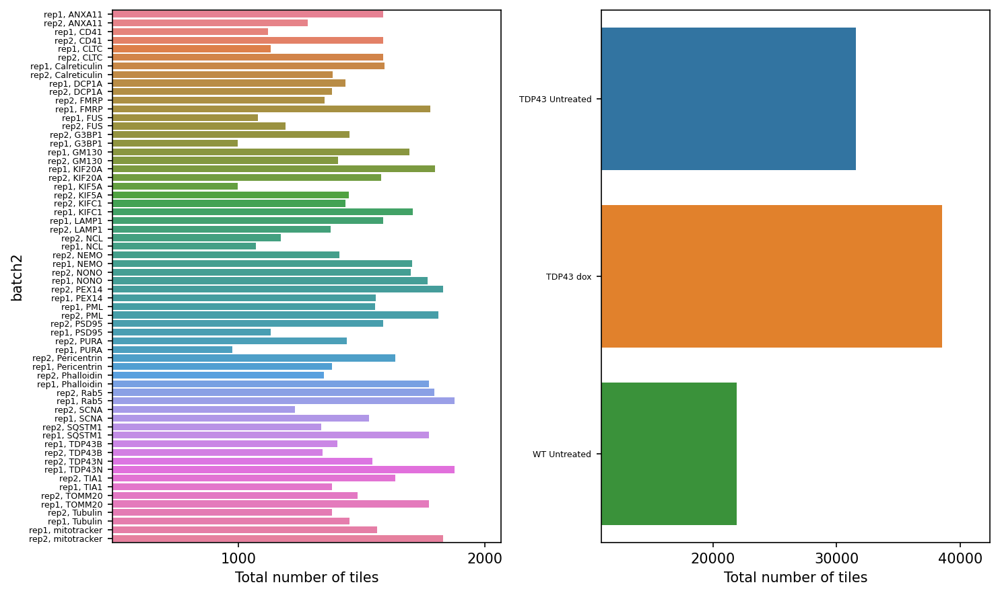

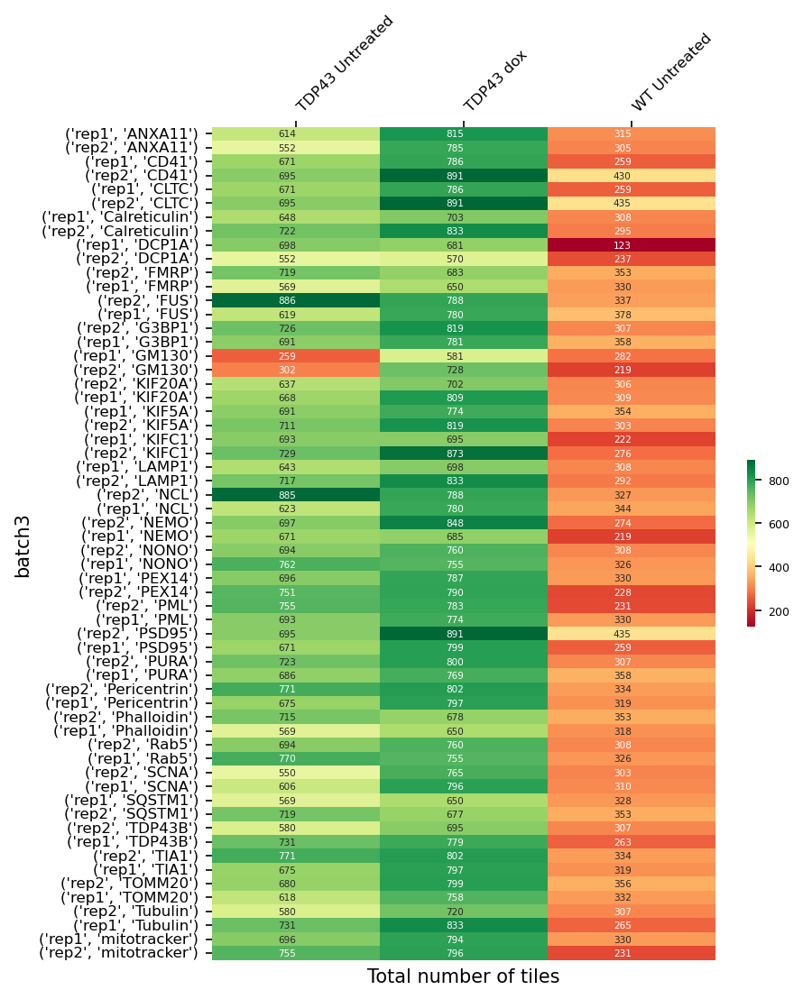

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)


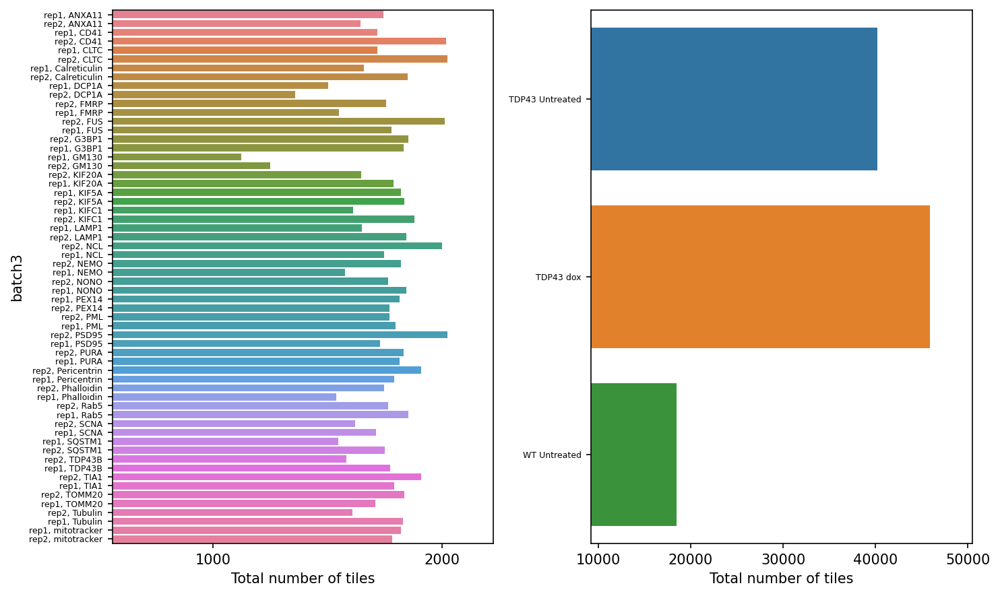

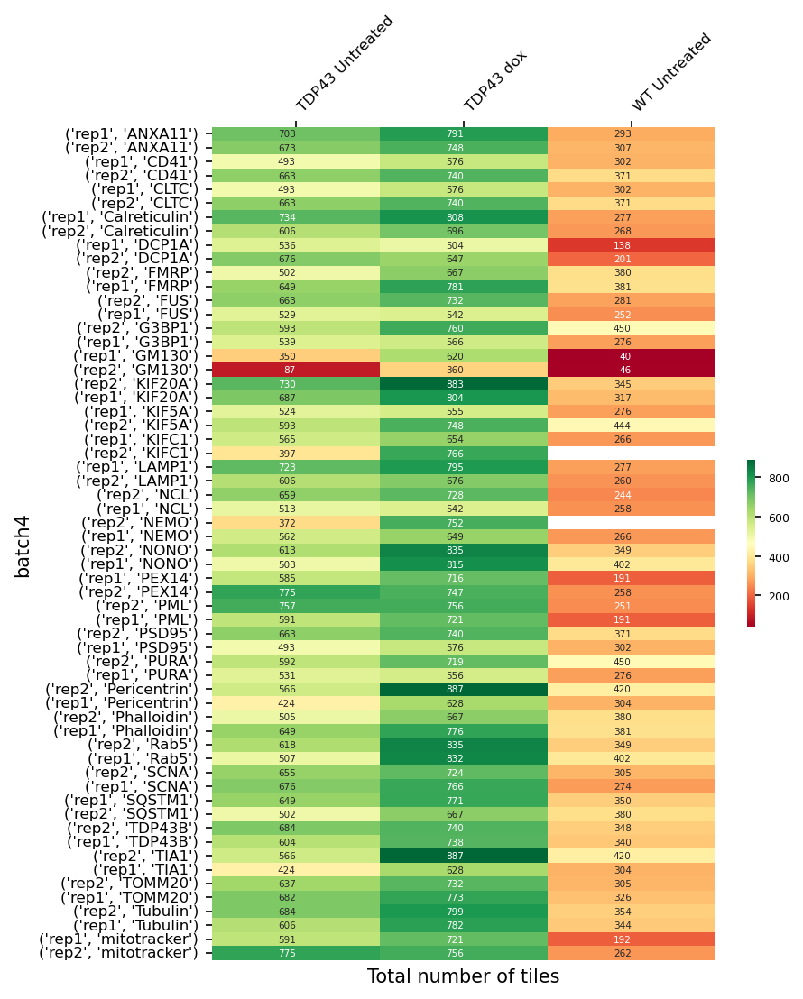

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)


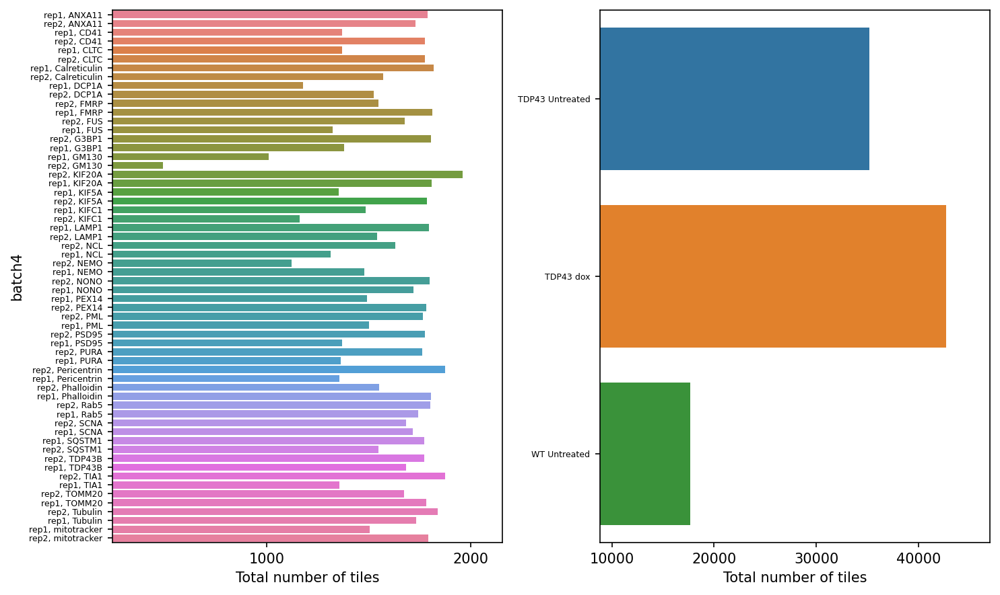

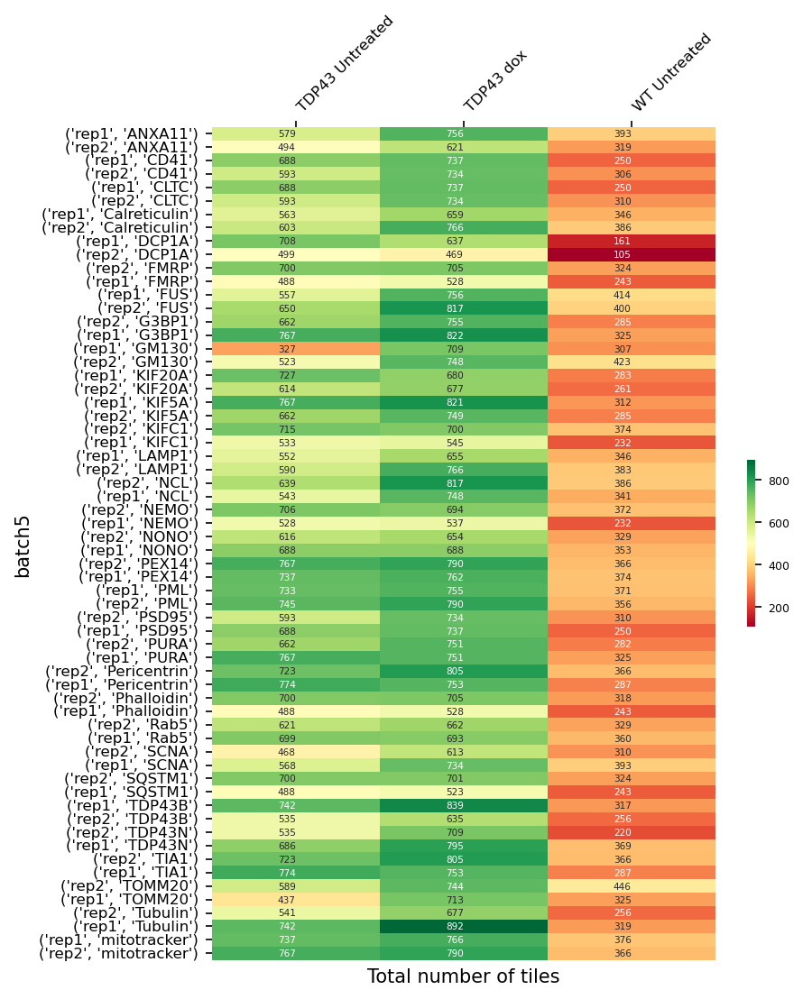

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)


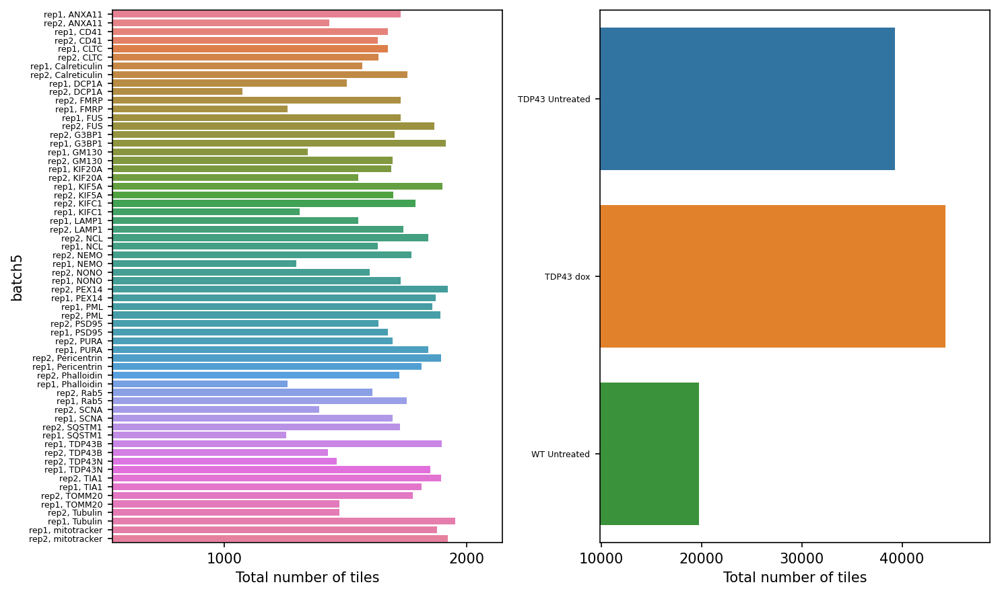

In [33]:
to_heatmap = total_sum.rename(columns={'n_valid_tiles':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of tiles', show_sum=True, figsize=(6,8))

### Show Total Whole Cell Counts
For each batch, cell line, replicate and markerTotal number of tiles

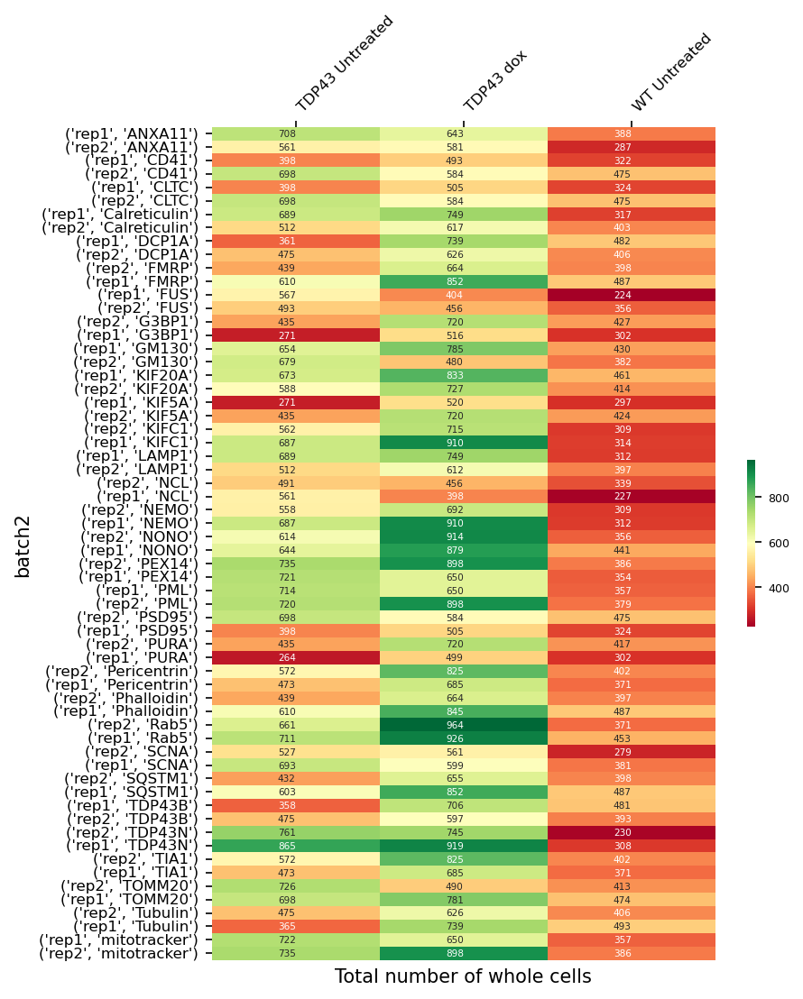

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)


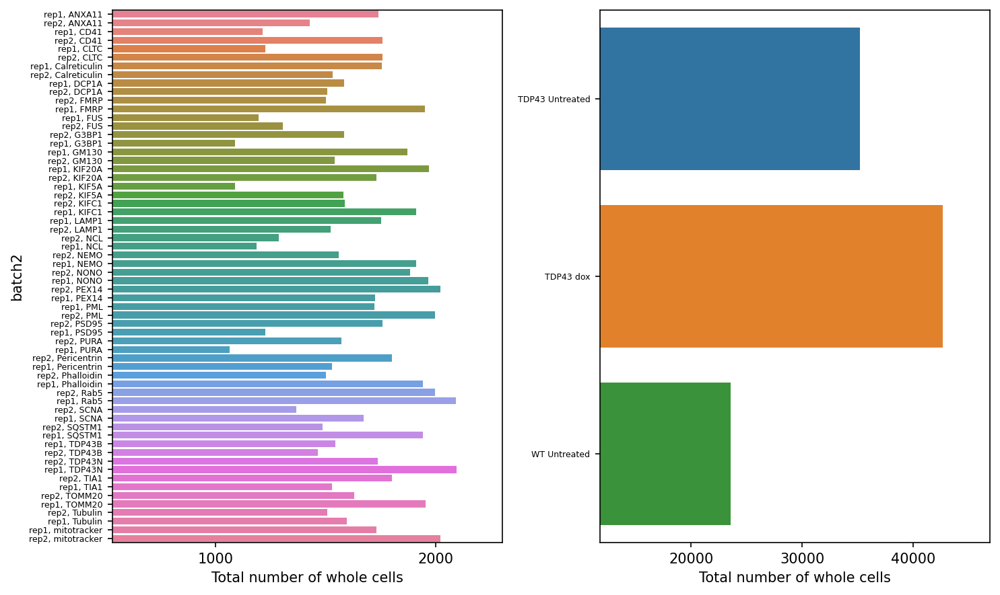

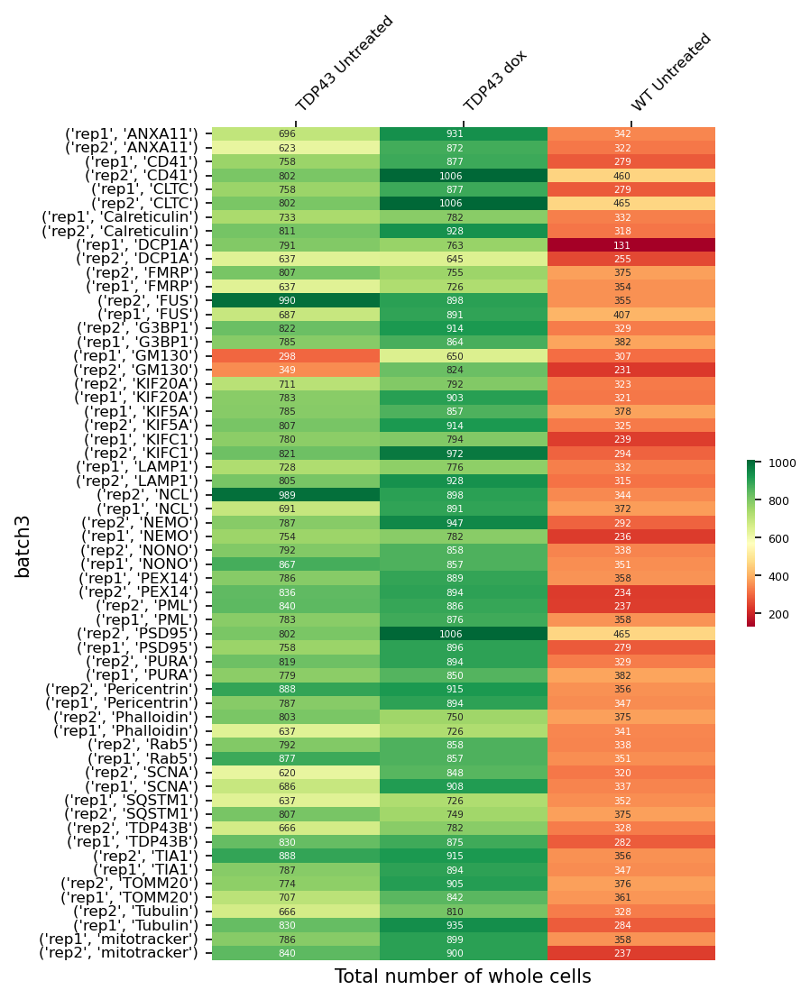

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)


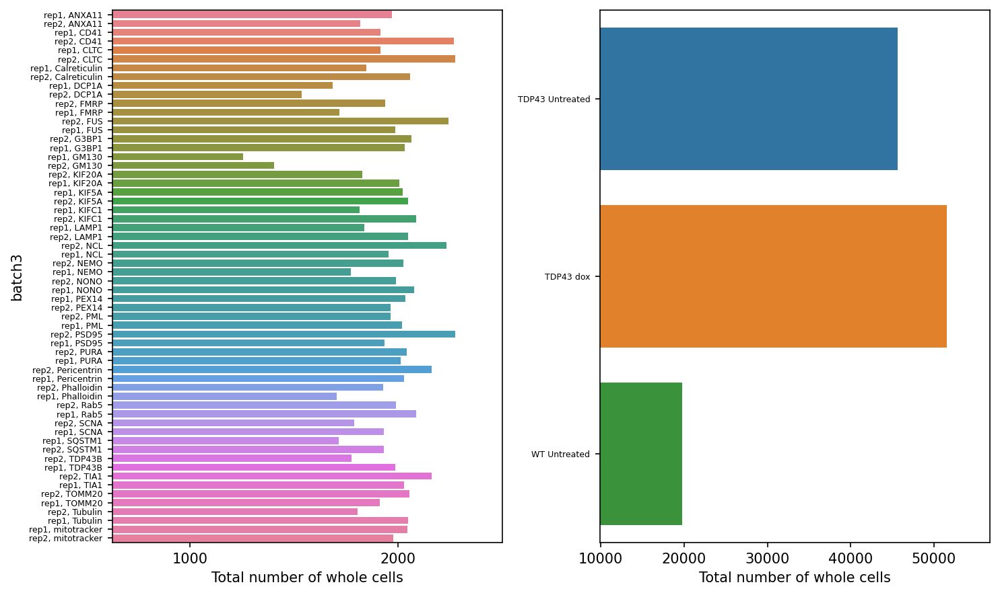

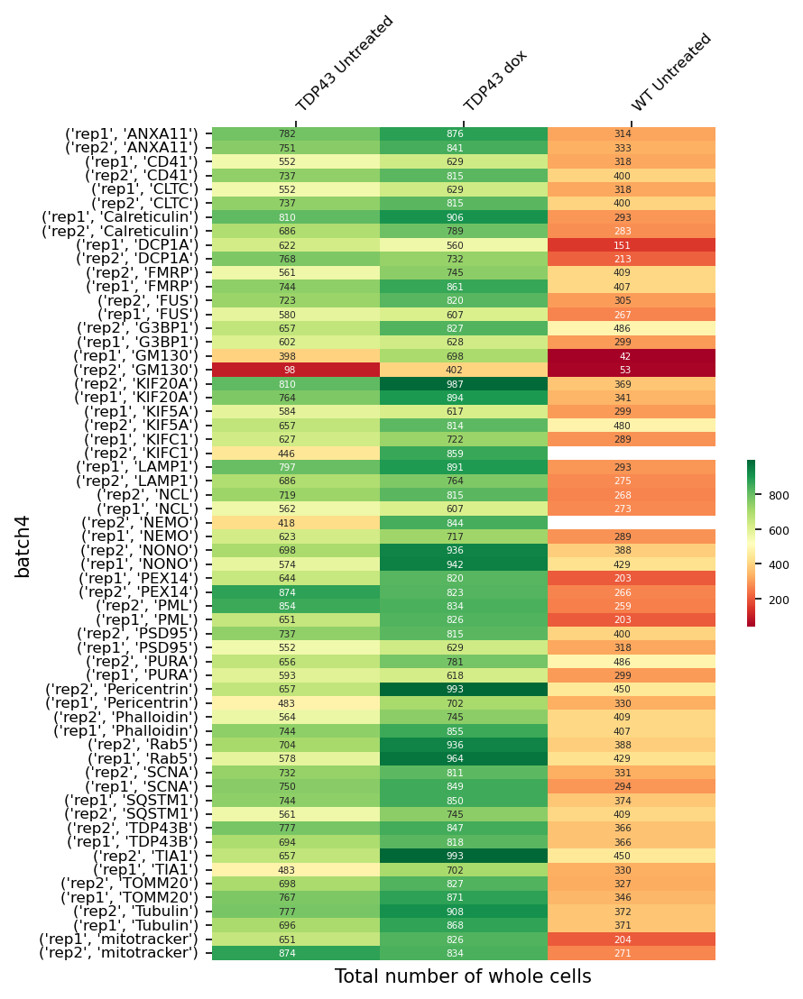

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)


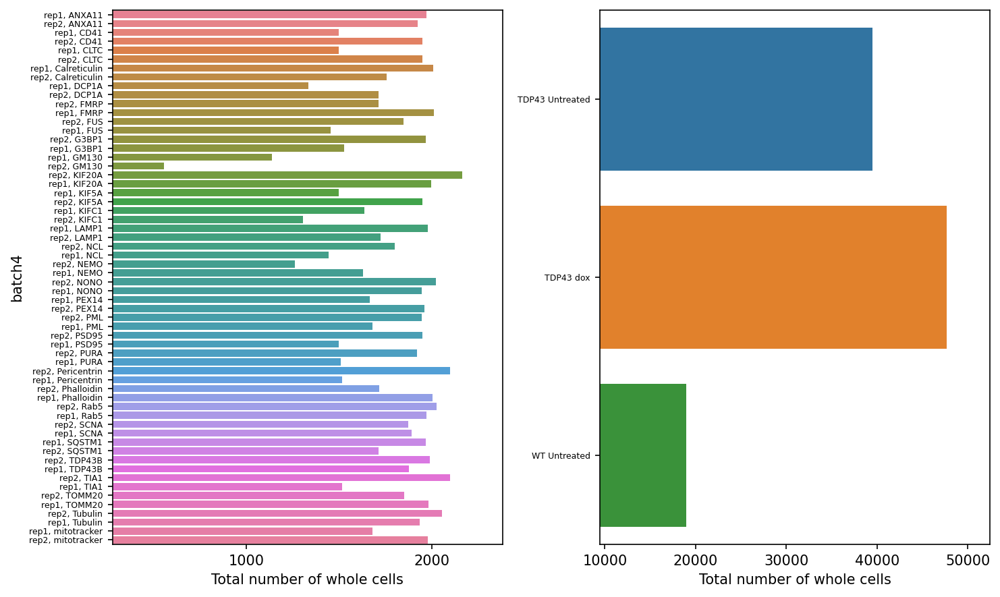

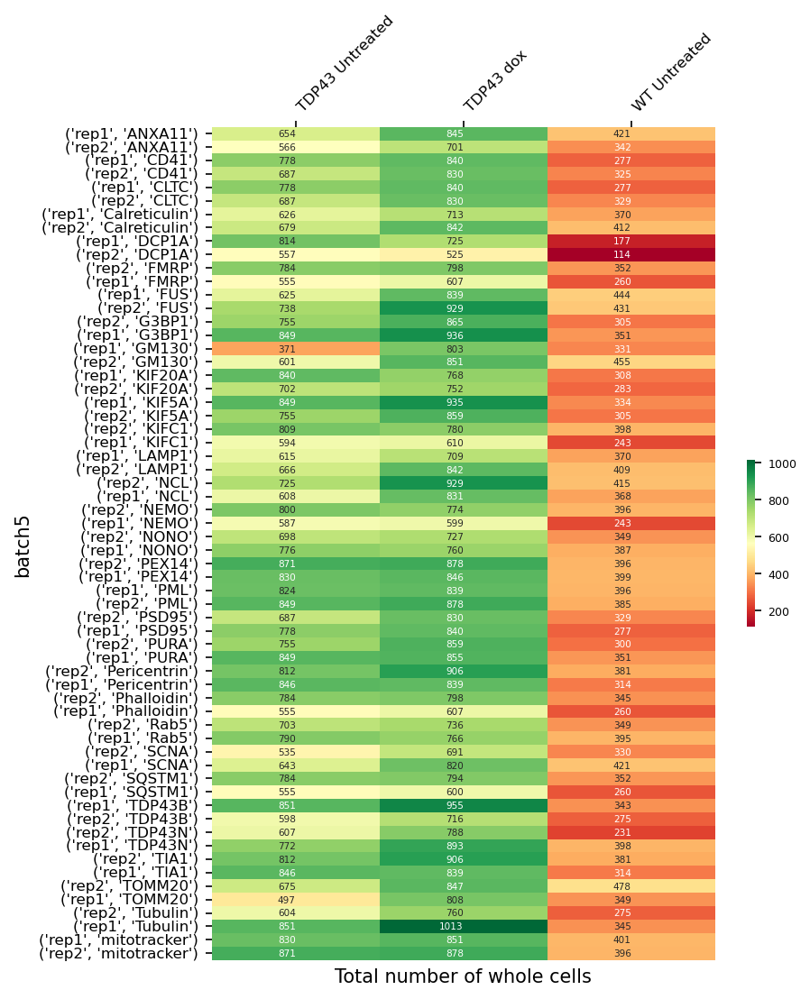

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:394: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  warnings.simplefilter("ignore", category=UserWarning)


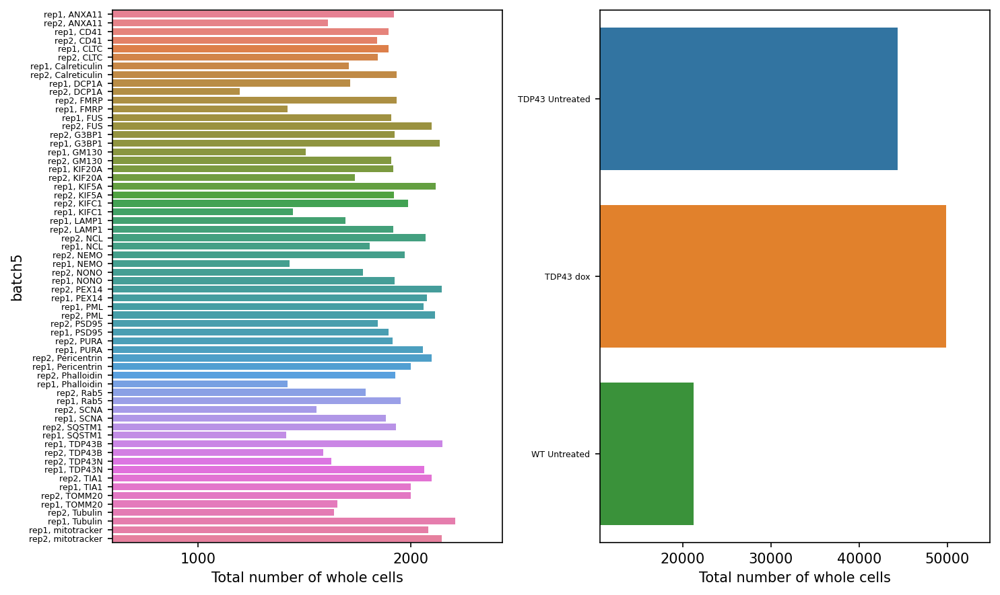

In [34]:
to_heatmap = total_sum.rename(columns={'site_whole_cells_counts_sum':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of whole cells', show_sum=True, figsize=(6,8))

### Show **Cell Count** Statistics per Batch

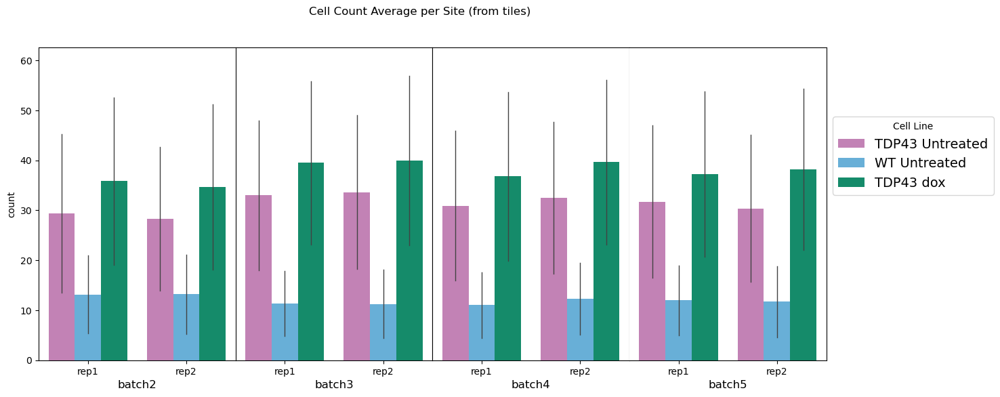

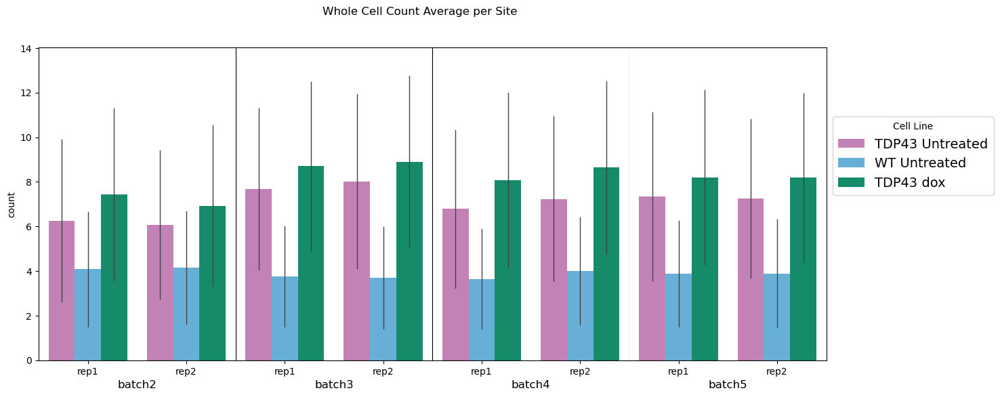

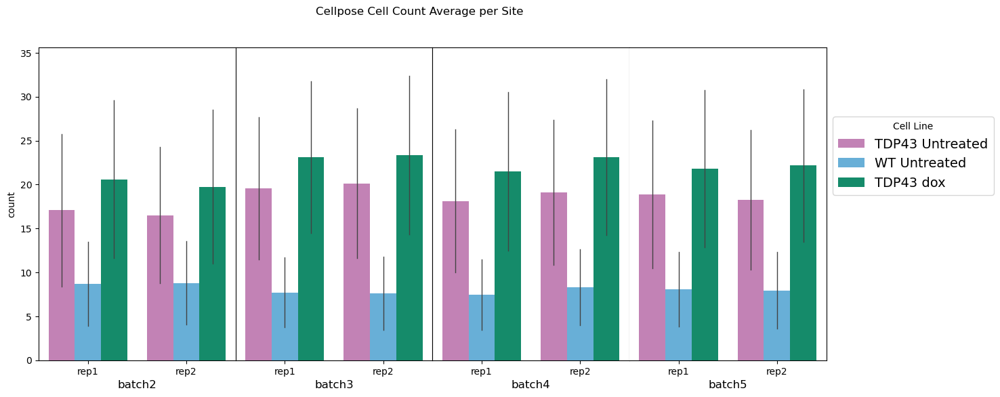

In [36]:
df_no_empty_sites = df_dapi[df_dapi.n_valid_tiles !=0]
plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_cell_count_sum', 
                title='Cell Count Average per Site (from tiles)')

plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_whole_cells_counts_sum',
                title='Whole Cell Count Average per Site')

plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_cell_count',
               title='Cellpose Cell Count Average per Site')


### Show **Tiles** per Site Statistics


In [37]:
df_dapi.groupby(['cell_line_cond']).n_valid_tiles.mean()

cell_line_cond
TDP43 Untreated    6.172955
TDP43 dox          7.201800
WT Untreated       3.345315
Name: n_valid_tiles, dtype: float64

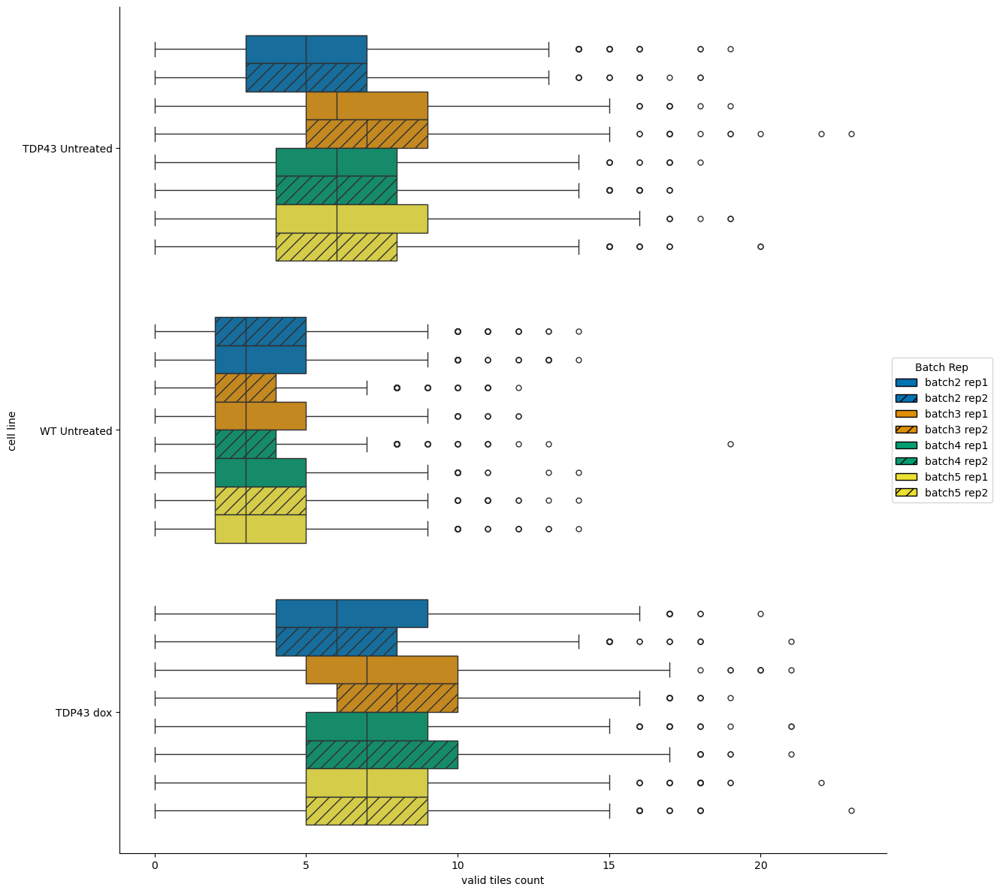

In [43]:
plot_catplot(df_dapi, custom_palette,reps, x='n_valid_tiles', x_title='valid tiles count', batch_min=2, batch_max=5)


### Show Mean of cell count in valid tiles

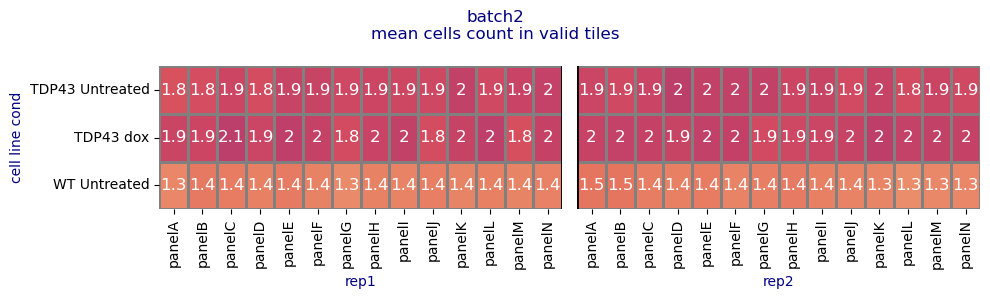

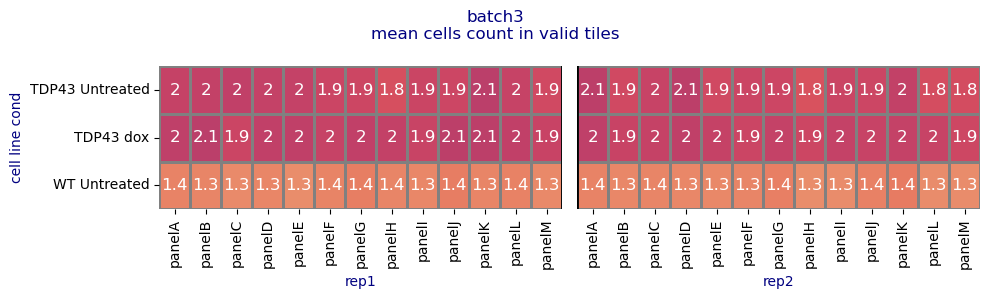

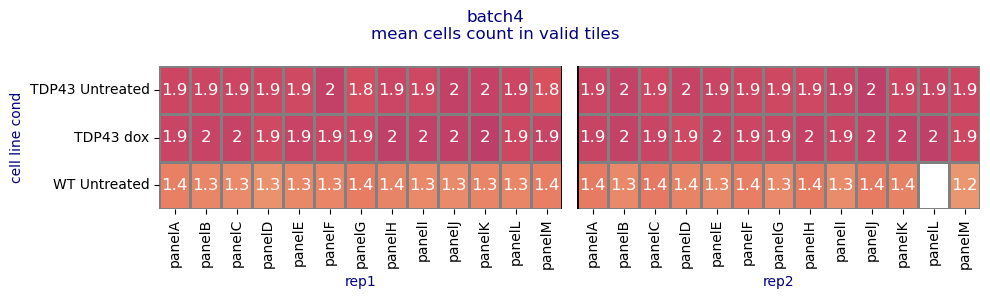

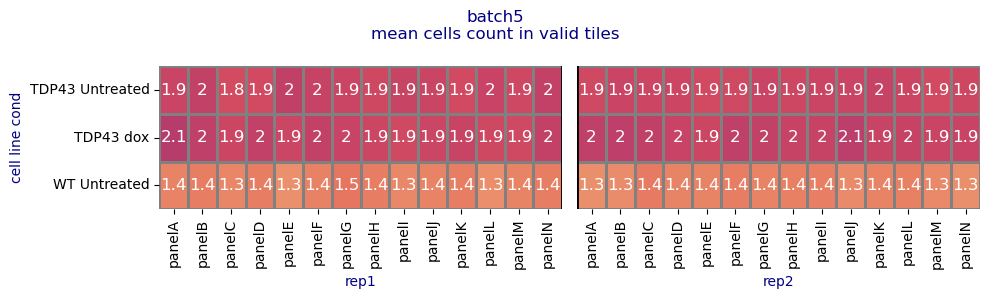

In [35]:
plot_hm(df_dapi, split_by='rep', rows='cell_line_cond', columns='panel', figsize=(10,3))


# Assessing Staining Reproducibility and Outliers

batch3


/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


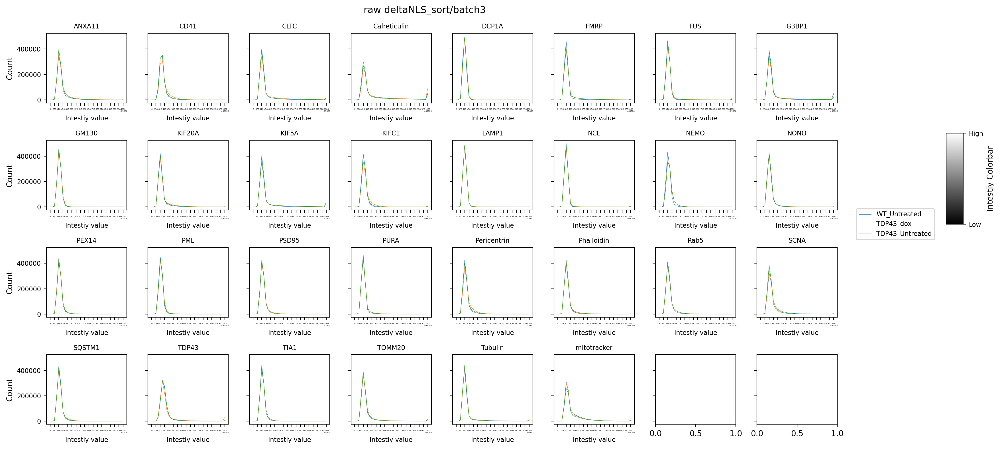

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


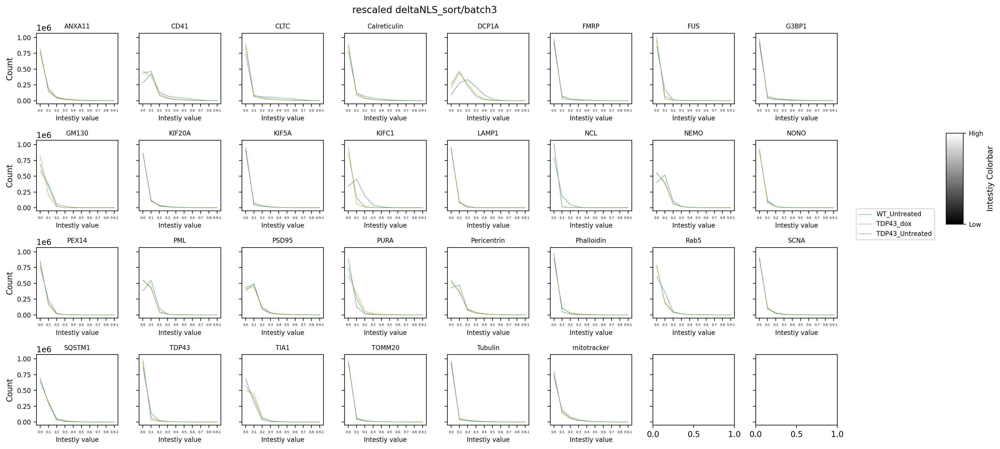

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


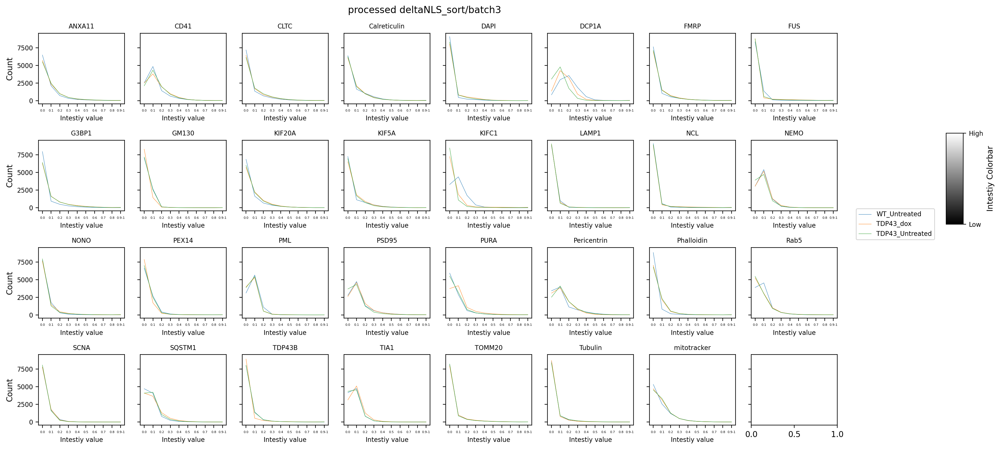

batch4


/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


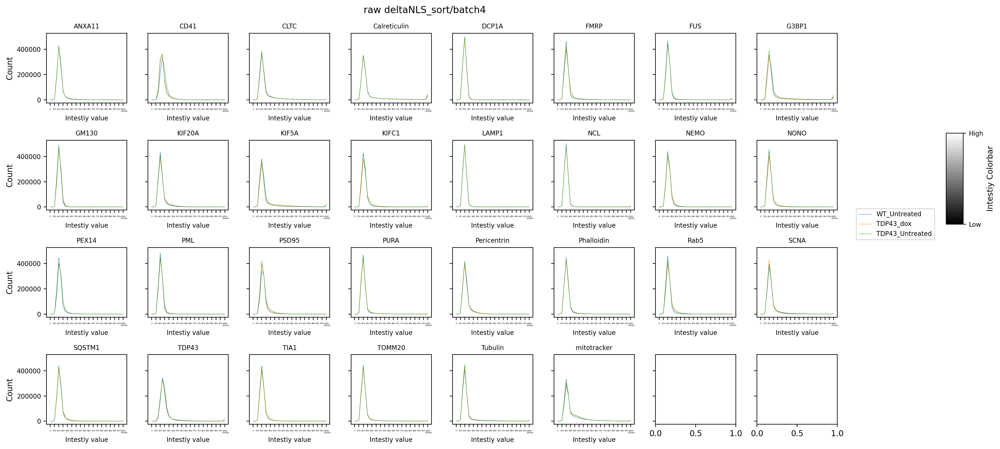

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


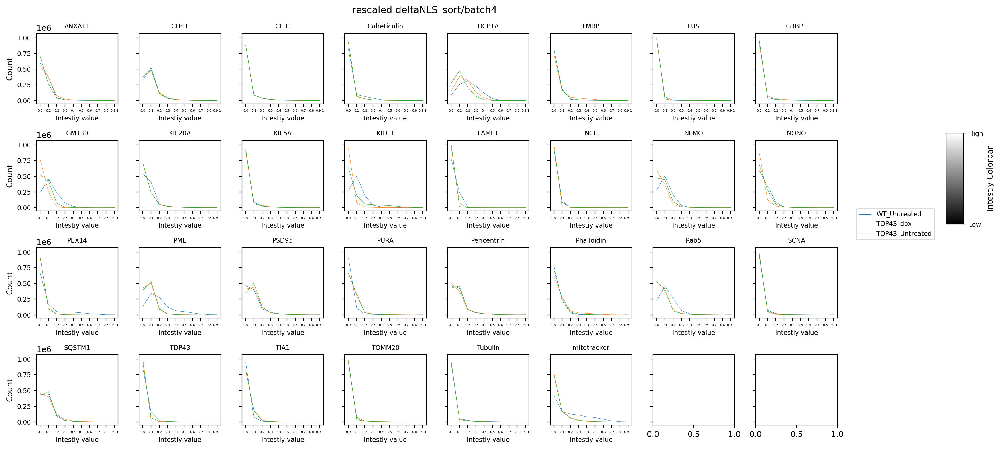

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


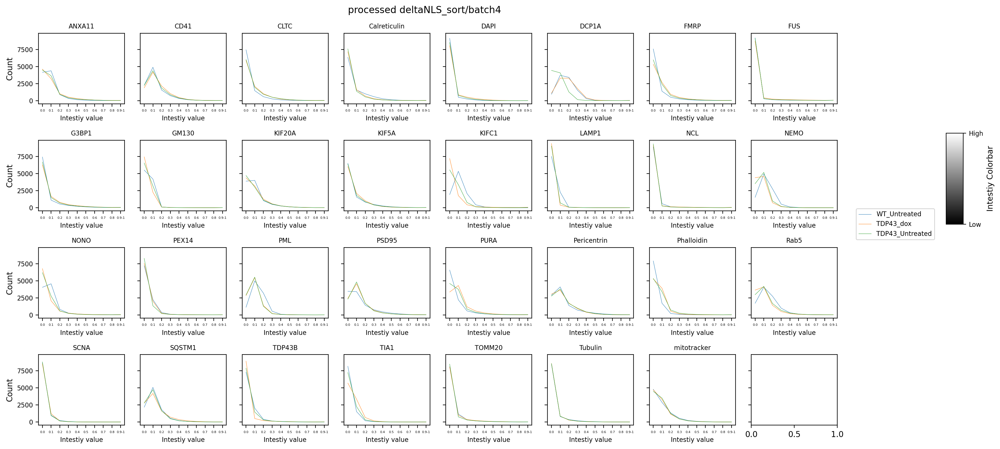

batch5


/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


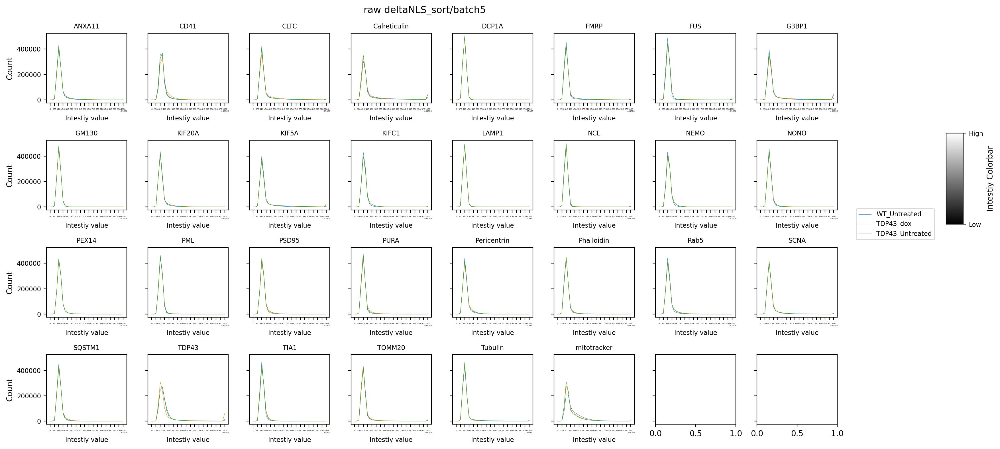

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


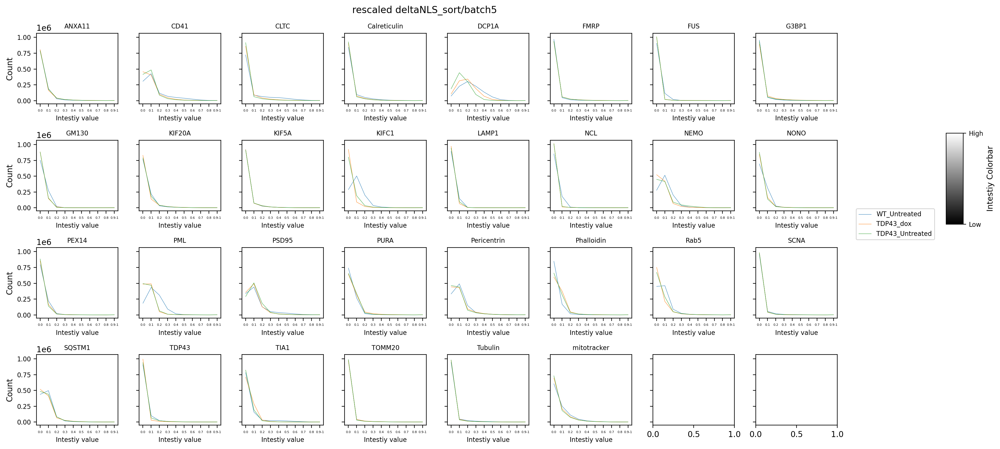

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_utils.py:950: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


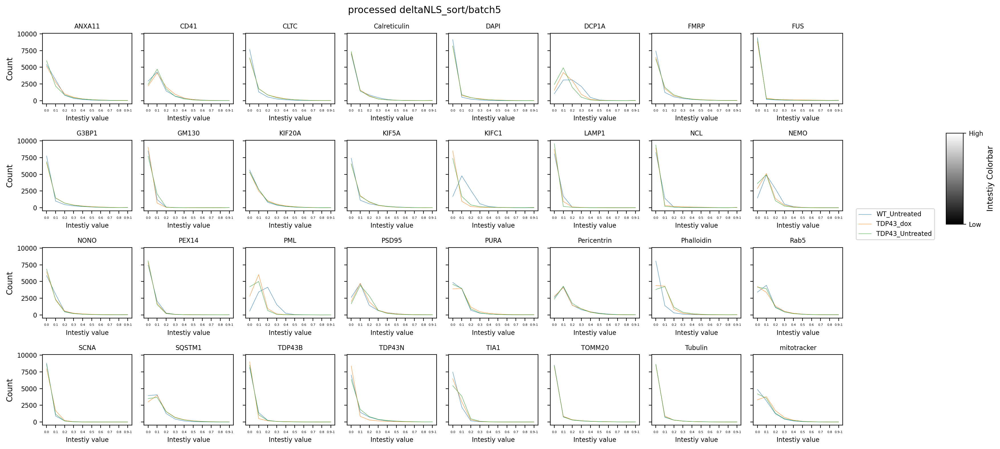

In [60]:
for batch in batches:
    print(batch)
    run_calc_hist_new(f'deltaNLS_sort/{batch}', dnls_cell_lines_for_disp, dnls_markers, 
                           hist_sample=10,sample_size_per_markers=200, ncols=8, nrows=4, dnls=True)
    print("="*30)

In [41]:
# save notebook as HTML ( the HTML will be saved in the same folder the original script is)
from IPython.display import display, Javascript
display(Javascript('IPython.notebook.save_checkpoint();'))
os.system('jupyter nbconvert --to html src/preprocessing/notebooks/no_ds/qc_report_newPP_dNLS.ipynb')

<IPython.core.display.Javascript object>

[NbConvertApp] Converting notebook src/preprocessing/notebooks/no_ds/qc_report_newPP_dNLS.ipynb to html
[NbConvertApp] Writing 14885367 bytes to src/preprocessing/notebooks/no_ds/qc_report_newPP_dNLS.html


0